In [1]:
import xarray as xr
import os
import glob
import numpy as np
import warnings
import matplotlib.pyplot as plt
import sys

warnings.filterwarnings("ignore")
sys.path.append('../src-double-gyre')
sys.path.append('../src')
from plot_helpers import create_animation_ffmpeg

%load_ext autoreload
%autoreload 3

# Goal
The purpose of this dataset is to create a high-quality dataset for training. The major difference with previous datasets is presense of filtering. Additionally, we would like to have additional metrics:
* Interfaces and theirs STDs.
* KE/APE with mean/eddy
* EKE spectrum
* Optionally, STDs of timeseries
* Statistics should be very accurate (90-years averages) with accurate noise models (10-year averages)
* This setup allows to perform optimization in short simulations (20-years) with noise determined only by the coarse simulation. This will allow to sample from the posterior and will give reasonable estimation of the model skill.
* Separately from noise model, we also provide normalization constants. This will allow to optimize quantities of different physical origin and more quantitatively compare relative contribution of various physical terms.

We note that properties outlined above relatively simple and we already have the code for their estimation.

# Step 1. Filtering

Will perform filtering with extra care as this is important for estimating APE, especially at coarse grid. We account for three things:
* Non-periodic boundary conditions
* One filter for interface height only
* Monotonic filter to prevent drop of interfaces

I probably will not try different FGRs. I know that Double Gyre can benefit from FGR=2, as this will make closure less dissipative. However, I know that in NW2 and global ocean we likely need to go back again to FGR3. The major reason is to make sure that the parameterization is strong enough to make a difference in global ocean, but not old consideration about relying on resolved turbulence. The resolved turbulence is really affected by the numerical approximation errors and not a good thing to play with. Probably because of this I had these problems with instabilities.

In [2]:
# Test standard option for filtering
from helpers.computational_tools import gaussian_filter

In [3]:
prog = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R32/output/prog*.nc')
static = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R32/output/ocean_geometry.nc').rename({'lonh': 'xh', 'lath': 'yh', 'lonq': 'xq', 'latq': 'yq'})

In [109]:
e = prog.e.isel(Time=333).compute()
ef = gaussian_filter(e, static.wet, filter_scale=48).compute()

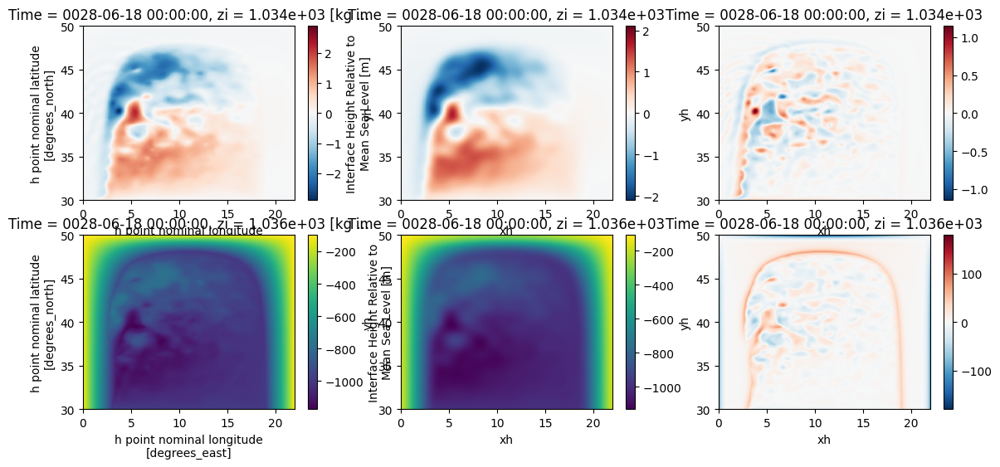

In [110]:
# Boundary treatment is accurate
# However, interfaces drop below the topography
# We need to reformulate filtering to make it monotonic

plt.figure(figsize=(14,6))

plt.subplot(2,3,1)
e.isel(zi=0).plot()

plt.subplot(2,3,2)
ef.isel(zi=0).plot()

plt.subplot(2,3,3)
(ef-e).isel(zi=0).plot()

plt.subplot(2,3,4)
e.isel(zi=1).plot()

plt.subplot(2,3,5)
ef.isel(zi=1).plot()

plt.subplot(2,3,6)
(ef-e).isel(zi=1).plot()

# Using monotonic GMFilter

In [118]:
ef_gm = xr.open_dataset('/scratch/pp2681/mom6/Feb2022/filtered/R32_R2_FGR3/interfaces/time_333.nc').ef

In [114]:
ef = ef.interp(xh=ef_gm.xh, yh=ef_gm.yh)
e = e.interp(xh=ef_gm.xh, yh=ef_gm.yh)

Text(0.5, 1.0, '')

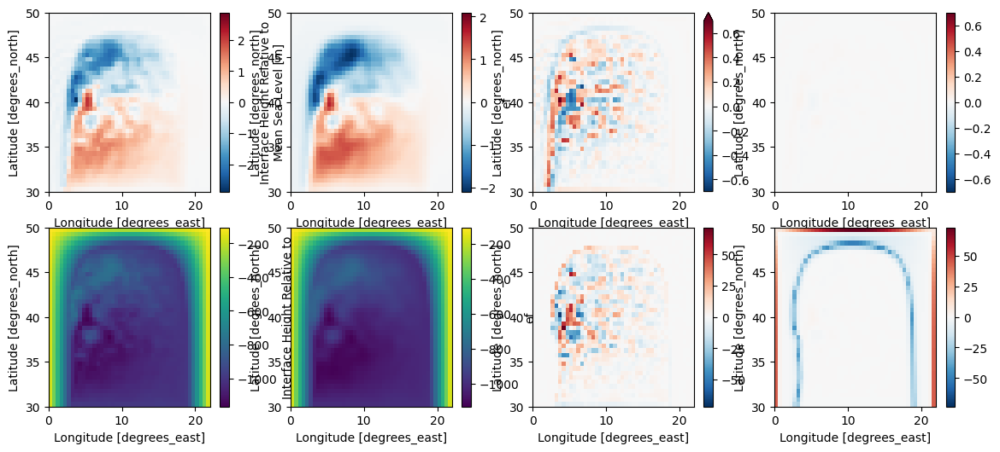

In [119]:
# Boundary treatment is accurate
# However, interfaces drop below the topography
# We need to reformulate filtering to make it monotonic

plt.figure(figsize=(14,6))

plt.subplot(2,4,1)
e.isel(zi=0).plot()
plt.title('')

plt.subplot(2,4,2)
ef_gm.isel(zi=0).plot()
plt.title('')

plt.subplot(2,4,3)
(ef_gm-e).isel(zi=0).plot(vmin=-0.7)
plt.title('')

plt.subplot(2,4,4)
(ef_gm-ef).isel(zi=0).plot(vmin=-0.7)
plt.title('')

plt.subplot(2,4,5)
e.isel(zi=1).plot()
plt.title('')

plt.subplot(2,4,6)
ef_gm.isel(zi=1).plot()
plt.title('')

plt.subplot(2,4,7)
(ef_gm-e).isel(zi=1).plot()
plt.title('')

plt.subplot(2,4,8)
(ef_gm-ef).isel(zi=1).plot()
plt.title('')

In [120]:
import xrft

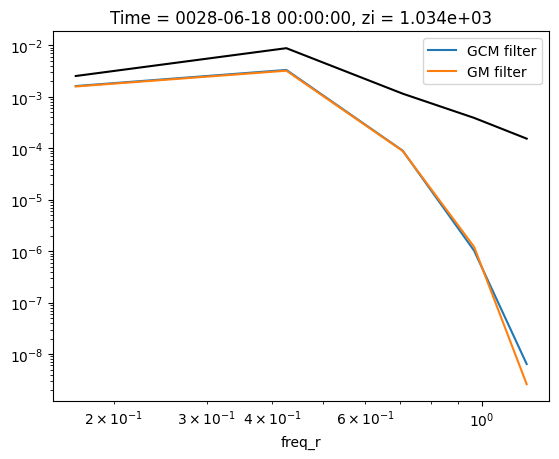

In [121]:
xrft.isotropic_power_spectrum(e.sel(xh=slice(5,15), yh=slice(35,45)), dim=['xh', 'yh'], window='hann', detrend='linear').isel(zi=0).plot(color='k')
xrft.isotropic_power_spectrum(ef.sel(xh=slice(5,15), yh=slice(35,45)), dim=['xh', 'yh'], window='hann', detrend='linear').isel(zi=0).plot(label='GCM filter')
xrft.isotropic_power_spectrum(ef_gm.sel(xh=slice(5,15), yh=slice(35,45)), dim=['xh', 'yh'], window='hann', detrend='linear').isel(zi=0).plot(label='GM filter')
plt.yscale('log')
plt.xscale('log')
plt.legend()

# Check filtering of the topography

In [2]:
R2 = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R2/output/prog*.nc').isel(Time=10)
R32 = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R32/output/prog*.nc').isel(Time=10)
R32_R2 = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/filtered/R32_R2_FGR3/interfaces/time_10.nc')

Text(0.5, 1.0, '')

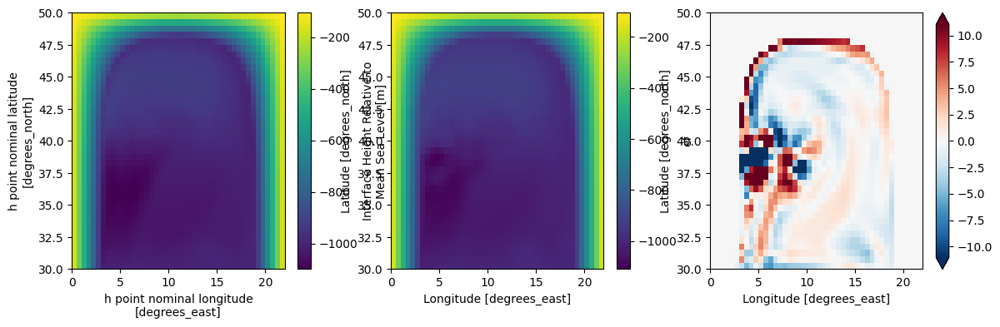

In [3]:
plt.figure(figsize=(14,4))
zi = 1
plt.subplot(1,3,1)
(R2.e).isel(zi=zi).plot()
plt.title('')

plt.subplot(1,3,2)
(R32_R2.ef).isel(zi=zi).plot()
plt.title('')

plt.subplot(1,3,3)
(R32_R2.ef-R2.e).isel(zi=zi).plot(robust=True)
plt.title('')

# Preparing dataset for calibration
Here, we average over last 90 years to produce target data. For estimation of the uncertainty, we use nine 10-year segments.

In [274]:
interfaces = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/filtered/R32_R8_FGR3/output/prog_full.nc', decode_times=False).e.sortby('Time').sel(Time=slice(365*10,None))

# Interfaces

In [275]:
dataset = xr.Dataset()
dataset['e_mean'] = interfaces.mean('Time')
dataset['e_std'] = interfaces.std('Time')

# Noise model for 10-years segments
segment_length = int(len(interfaces.Time) / 9)
segments = interfaces.coarsen({'Time': segment_length}, boundary='trim')

dataset['e_mean_var'] = segments.mean().var('Time')
dataset['e_std_var'] = segments.std().var('Time')

# Average noise model layerwise to make loss function similar to RMSE
dataset['e_mean_var_ave'] = dataset['e_mean_var'].mean(['xh', 'yh']) + dataset['e_mean_var'] * 0
dataset['e_std_var_ave'] = dataset['e_std_var'].mean(['xh', 'yh']) + dataset['e_std_var'] * 0

In [276]:
dataset.isel(zi=slice(0,2)).astype('float32').to_netcdf('../scripts/R32/R8_FGR3.nc')

# Energy-based noise model

In [2]:
from helpers.collection_of_experiments import CollectionOfExperiments
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/filtered', additional_subfolder='output')
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

In [3]:
# Units are petajoules
KE_coarse = ds['R32_R2_FGR3'].KE_joul_series.sel(Time=slice(365*10,None)).compute() * 1e-15
APE_coarse = xr.concat([ds['R32_R2_FGR3'].PE_ssh_series.drop_vars(['zi', 'zl']), ds['R32_R2_FGR3'].PE_joul_series], dim='zi').sel(Time=slice(365*10,None)).compute() * 1e-15

In [6]:
dataset = xr.Dataset()

In [7]:
dataset['KE_mean'] = KE_coarse.mean('Time')
dataset['APE_mean'] = APE_coarse.mean('Time')

dataset['KE_std'] = KE_coarse.std('Time')
dataset['APE_std'] = APE_coarse.std('Time')

In [10]:
# This way of normalization retains MSE-type error but ensures that
# When coarse model has zero energy, the MSE-type error is simply
# the error in PJ
dataset['KE_PJvar'] =  dataset["KE_mean"]
dataset['APE_PJvar'] = dataset["APE_mean"]

# This way of normalization retains MSE-type error but ensures that
# When coarse model has zero energy, the MSE-type error is simply
# the error in PJ
dataset['KE_std_PJvar'] =  dataset["KE_std"]
dataset['APE_std_PJvar'] = dataset["APE_std"]

In [11]:
dataset = dataset.compute()

In [12]:
interfaces = ds['R32_R2_FGR3'].e.sel(Time=slice(365*10,None)).isel(zi=slice(0,2))
u = ds['R32_R2_FGR3'].u.sel(Time=slice(365*10,None))
v = ds['R32_R2_FGR3'].v.sel(Time=slice(365*10,None))
h = ds['R32_R2_FGR3'].h.sel(Time=slice(365*10,None))
param = ds['R32_R2_FGR3'].param
from xgcm import Grid
grid = Grid(param, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
        },
        boundary={'X': 'fill', 'Y': 'fill'},
        fill_value = {'Y': 0, 'X': 0})

In [13]:
# This conversion factor includes both reference density and conversion to Petajoules from joules
rho0 = 1035
J_to_PJ = 1e-15
g_prime = xr.DataArray([0.98, 0.0098], dims='zi')
# Elementary volumes and area
dST = param.dxT * param.dyT
# We have to introduce clipping. Otherwise there will be nans in the algorithm.
dVu = param.dxCu * param.dyCu * np.maximum(grid.interp(h, 'X').mean('Time'), 10.0)
dVv = param.dxCv * param.dyCv * np.maximum(grid.interp(h, 'Y').mean('Time'), 10.0)

In [14]:
# Scalings used to convert the L2 error squared in u and v velocities to units of peta joules
dataset['u_PJvar'] = 1 / (J_to_PJ * rho0 * dVu)
dataset['v_PJvar'] = 1 / (J_to_PJ * rho0 * dVv)

# Scalings used to convert the L2 error squared in interfaces to units of peta joules
dataset['e_PJvar'] = 1 / (J_to_PJ * rho0 * g_prime * dST)

In [15]:
dataset['e_mean'] = interfaces.mean('Time')
dataset['e_std'] = interfaces.std('Time')
dataset['u_mean'] = u.mean('Time')
dataset['v_mean'] = v.mean('Time')
dataset['u_std'] = u.std('Time')
dataset['v_std'] = v.std('Time')

In [16]:
dataset = dataset.transpose('zl',...).transpose('zi',...)

In [17]:
dataset = dataset.compute().fillna(0.)

In [18]:
dataset.to_netcdf('../scripts/R32/R2_FGR3_PJ.nc')

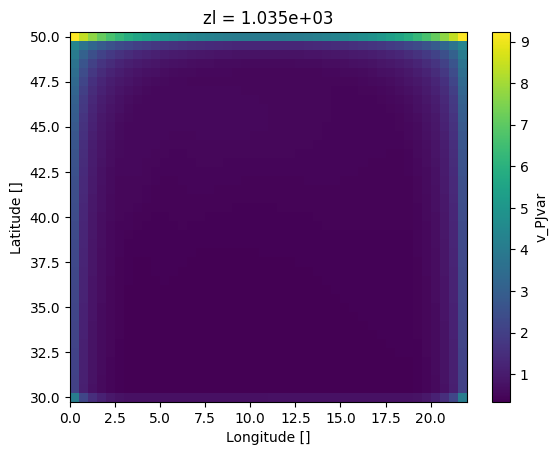

In [106]:
dataset['v_PJvar'][0].plot()

# Test correctness of typical scales in PJ

In [207]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_PJ/metrics_00.nc').load()

In [208]:
metrics['KE_mean'].isel(ens=0)

<xarray.DataArray 'KE_mean' (zl: 2)> Size: 16B
array([10.59538326,  0.63811956])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [209]:
metrics['KE_mean_RMSE'][0]

<xarray.DataArray 'KE_mean_RMSE' (zl: 2)> Size: 16B
array([5.15399048, 0.28926476])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [210]:
metrics['APE_mean_RMSE'][0]

<xarray.DataArray 'APE_mean_RMSE' (zi: 2)> Size: 16B
array([ 0.29509833, 25.56421963])
Coordinates:
  * zi       (zi) float64 16B 1.034e+03 1.036e+03

In [211]:
metrics['KE_mean_WSE'][0]

<xarray.DataArray 'KE_mean_WSE' (zl: 2)> Size: 16B
array([4.88176813, 0.23985367])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [212]:
metrics['APE_mean_WSE'][0]

<xarray.DataArray 'APE_mean_WSE' (zi: 2)> Size: 16B
array([0.11869755, 9.00001708])
Coordinates:
  * zi       (zi) float64 16B 1.034e+03 1.036e+03

In [213]:
metrics['KE_std_WSE'].isel(ens=0)

<xarray.DataArray 'KE_std_WSE' (zl: 2)> Size: 16B
array([0.34814937, 0.26368314])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [214]:
metrics['APE_std_WSE'].isel(ens=0)

<xarray.DataArray 'APE_std_WSE' (zi: 2)> Size: 16B
array([0.00083609, 0.05997472])
Coordinates:
  * zi       (zi) float64 16B 1.034e+03 1.036e+03

In [215]:
(metrics['u_mean_WSE'] + metrics['v_mean_WSE'] + metrics['u_std_WSE'] + metrics['v_std_WSE'])[0]

<xarray.DataArray (zl: 2)> Size: 16B
array([13.74743126,  0.40031783])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [216]:
(metrics['e_mean_WSE'] + metrics['e_std_WSE'])[0]

<xarray.DataArray (zi: 2)> Size: 16B
array([ 0.34678646, 32.75904284])
Coordinates:
  * zi       (zi) float64 16B 1.034e+03 1.036e+03

In [219]:
np.sort(metrics['WMSE'])/ np.min(metrics['WMSE']).values

array([ 1.        ,  1.00649493,  1.02321024,  1.06896156,  1.161499  ,
        1.19602998,  1.2039422 ,  1.20927699,  1.21493064,  1.23346513,
        1.24722152,  1.25740615,  1.25822731,  1.2984903 ,  1.30888598,
        1.33743278,  1.3400571 ,  1.36783063,  1.44127166,  1.44760871,
        1.4820334 ,  1.49738932,  1.54738196,  1.55854223,  1.69451266,
        1.77941839,  1.79639753,  1.79746763,  1.83997655,  1.84419613,
        1.8586554 ,  1.88180251,  1.89632922,  1.90528324,  1.90773046,
        1.9568101 ,  2.02493097,  2.05790206,  2.05902047,  2.0863643 ,
        2.13665496,  2.13914203,  2.14315051,  2.1614119 ,  2.25134192,
        2.31577663,  2.37570213,  2.38174456,  2.39371609,  2.52550372,
        2.54828269,  2.60551289,  2.6620857 ,  2.7071997 ,  2.78700229,
        2.80784781,  2.83922197,  2.84580078,  2.86119705,  2.86169193,
        2.9780571 ,  2.99221289,  3.00623173,  3.08486028,  3.10630899,
        3.13369244,  3.14093277,  3.14213344,  3.16461519,  3.17

# Not noise-based normalization constants

In [100]:
# The resulting loss for the energetics is
# (KE-KE_true)**2/KE_true**2
# layerwise
for variable in ['KE_mean', 'KE_std', 'APE_mean', 'APE_std']:
    dataset[f'{variable}_var_loss'] = dataset[variable]**2

In [101]:
mask = (observation.e_std>0.0001)

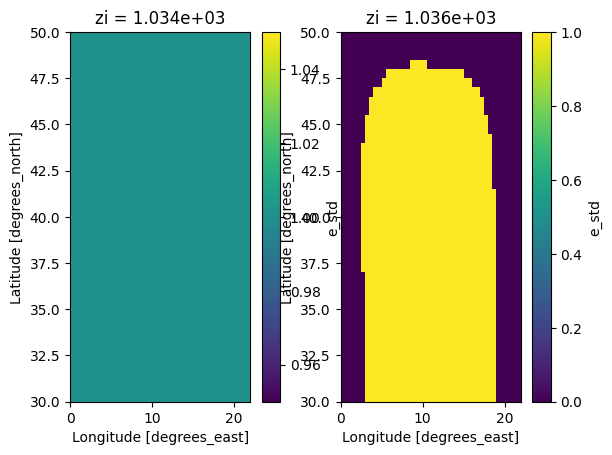

In [102]:
plt.subplot(1,2,1)
mask[0].plot()
plt.subplot(1,2,2)
mask[1].plot()

In [103]:
# For 2D fields we normalize by their l2 norm squared. That way, the normalization constant will grow with the number of grid points, preveting total dominance of 2d fields
ssh_mean_var_loss = (observation.e_mean.isel(zi=0)**2).sum()
ssh_std_var_loss  = (observation.e_std.isel(zi=0)**2).sum()

# For internal interface, we sum only over degrees of freedom that are not topography and centered to 1000., which is the resting position of the interface
interface_mean_var_loss = ((observation.e_mean.isel(zi=1)+1000.)**2).where(mask.isel(zi=1)).sum()
interface_std_var_loss  = ((observation.e_std.isel(zi=1))**2).sum()

In [104]:
dataset['e_mean_var_loss'] = xr.concat([ssh_mean_var_loss, interface_mean_var_loss], dim='zi') + 0*dataset['e_mean']
dataset['e_std_var_loss']  = xr.concat([ssh_std_var_loss, interface_std_var_loss], dim='zi') + 0*dataset['e_std']

In [105]:
dataset.astype('float32').to_netcdf('../scripts/R32/R2_FGR3_series_loss.nc')

# Filtering remaining fields

In [2]:
prog = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R32/output/prog*.nc')

In [3]:
import xgcm
lores_static = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R2/output/ocean_geometry.nc').rename({'lonh': 'xh', 'lath': 'yh', 'lonq': 'xq', 'latq': 'yq'})
static = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/bare/R32/output/ocean_geometry.nc').rename({'lonh': 'xh', 'lath': 'yh', 'lonq': 'xq', 'latq': 'yq'})
static = static.fillna(0.).pad({'xh':1, 'yh':1, 'xq':1, 'yq':1}, constant_values=0).chunk({'xh':-1, 'yh':-1})

grid = xgcm.Grid(static, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
        },
        boundary={'X': 'fill', 'Y': 'fill'},
        fill_value = {'Y': 0})

wet_u = grid.interp(static.wet,'X')
static['wet_u'] = xr.where(wet_u<1., 0., 1.)

wet_v = grid.interp(static.wet,'Y')
static['wet_v'] = xr.where(wet_v<1., 0., 1.)

wet_c = grid.interp(static.wet,['Y', 'X'])
static['wet_c'] = xr.where(wet_c<1., 0., 1.)

static = static.isel({'xh':slice(1,-1), 'yh':slice(1,-1), 'xq':slice(1,-1), 'yq':slice(1,-1)})

In [4]:
from helpers.computational_tools import gaussian_filter
from dask.diagnostics import ProgressBar

In [5]:
with ProgressBar():
    uf = gaussian_filter(prog.u, static.wet_u, filter_scale=48).interp(xq=lores_static.xq, yh=lores_static.yh).compute()

[########################################] | 100% Completed | 512.14 s


In [36]:
uf.astype('float32').to_netcdf('/scratch/pp2681/mom6/Feb2022/filtered/R32_R2_FGR3/dynamics/uf.nc')

In [39]:
with ProgressBar():
    vf = gaussian_filter(prog.v, static.wet_v, filter_scale=48).interp(xh=lores_static.xh, yq=lores_static.yq).compute()

[########################################] | 100% Completed | 499.15 s


In [40]:
with ProgressBar():
    RVf = gaussian_filter(prog.RV, static.wet_c, filter_scale=48).interp(xq=lores_static.xq, yq=lores_static.yq).compute()

[########################################] | 100% Completed | 504.40 s


In [41]:
vf.astype('float32').to_netcdf('/scratch/pp2681/mom6/Feb2022/filtered/R32_R2_FGR3/dynamics/vf.nc')
RVf.astype('float32').to_netcdf('/scratch/pp2681/mom6/Feb2022/filtered/R32_R2_FGR3/dynamics/RVf.nc')

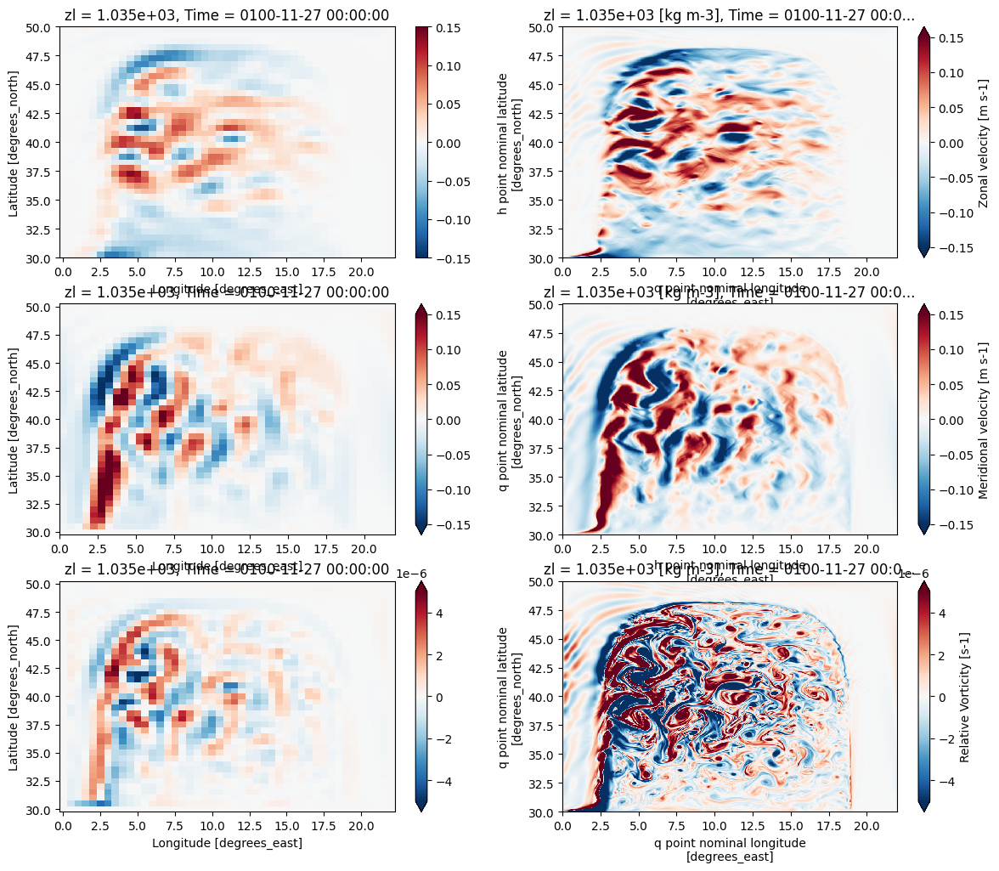

In [47]:
plt.figure(figsize=(14,12))
plt.subplot(3,2,1)
uf[-1][0].plot(vmin=-0.15)

plt.subplot(3,2,2)
prog.u[-1][0].plot(vmin=-0.15)

plt.subplot(3,2,3)
vf[-1][0].plot(vmin=-0.15)

plt.subplot(3,2,4)
prog.v[-1][0].plot(vmin=-0.15)

plt.subplot(3,2,5)
RVf[-1][0].plot(vmin=-0.5e-5)

plt.subplot(3,2,6)
prog.RV[-1][0].plot(vmin=-0.5e-5)

# Combine data to prog file

In [267]:
prog = xr.open_mfdataset('/scratch/pp2681/mom6/Feb2022/filtered/R32_R8_FGR3/snapshots/*.nc', combine='nested', concat_dim='Time').sortby('Time')

In [268]:
prog = prog.compute()

In [269]:
prog.to_netcdf('/scratch/pp2681/mom6/Feb2022/filtered/R32_R8_FGR3/output/prog_full.nc')

# Compare different filtering methods

In [69]:
from helpers.collection_of_experiments import CollectionOfExperiments

In [70]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

In [71]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/filtered', additional_subfolder='output')

In [50]:
ds.remesh('R32','R2')

Experiment R32 coarsegrained to R2 is created. Its identificator=R32_R2


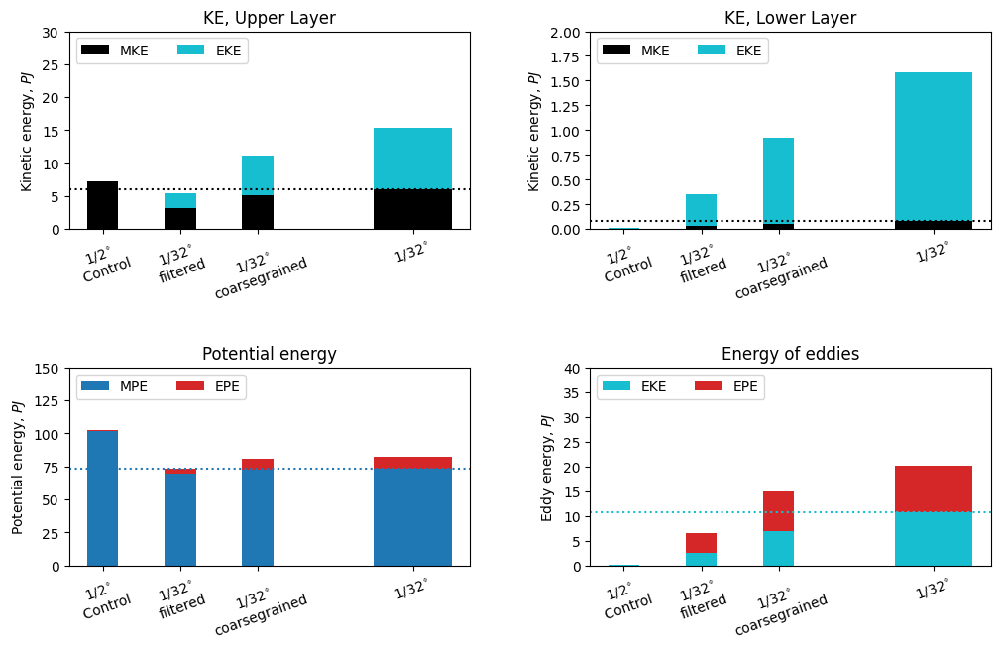

In [67]:
ds.plot_KE_PE(['R2', 'R32_R2_FGR3', 'R32_R2', 'R32'], ['$1/2^{\circ}$ \n Control', '$1/32^{\circ}$ \nfiltered', '$1/32^{\circ}$ \ncoarsegrained', '$1/32^{\circ}$'])

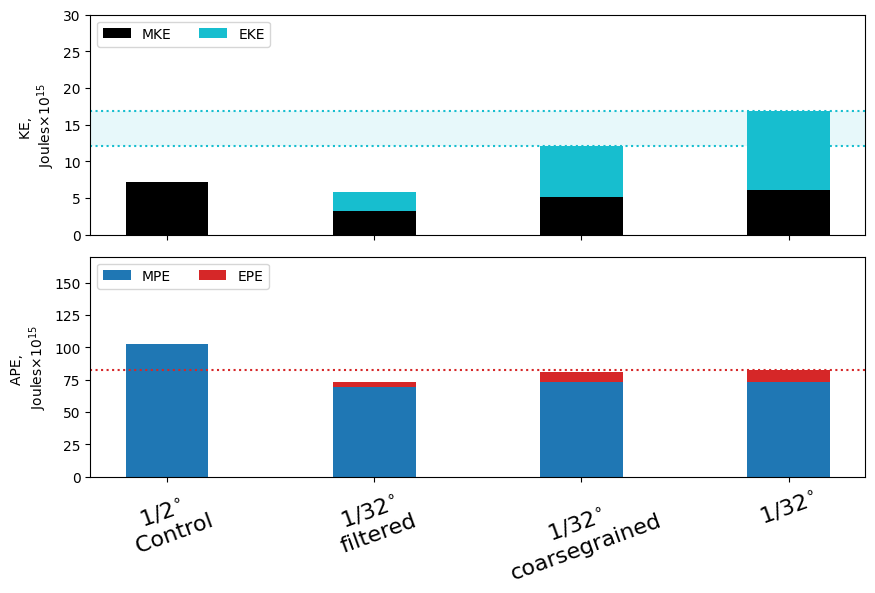

In [68]:
ds.plot_KE_PE_simpler(['R2', 'R32_R2_FGR3', 'R32_R2', 'R32'], ['$1/2^{\circ}$ \n Control', '$1/32^{\circ}$ \nfiltered', '$1/32^{\circ}$ \ncoarsegrained', '$1/32^{\circ}$'])

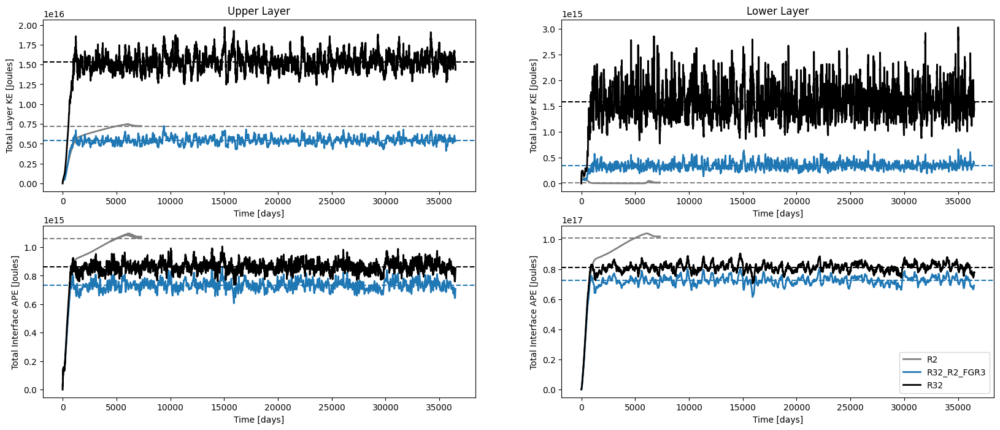

In [84]:
ds.plot_series(['R2', 'R32_R2_FGR3', 'R32'])

# Check results

In [2]:
from helpers.collection_of_experiments import CollectionOfExperiments

In [3]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

In [4]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/filtered', additional_subfolder='output')

In [5]:
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration', additional_subfolder='output')

In [8]:
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/generalization', additional_subfolder='output')

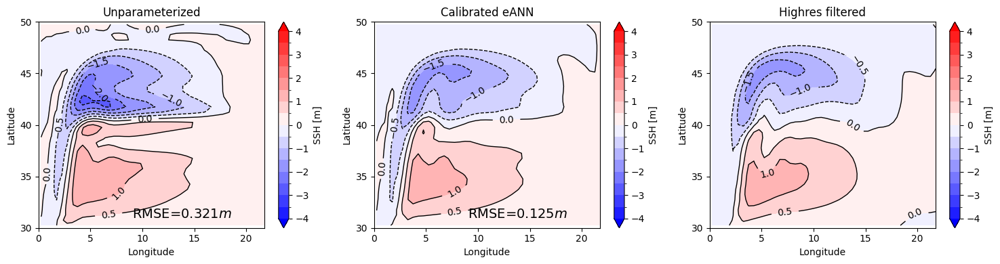

In [218]:
ds.plot_ssh(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'], zi=0)

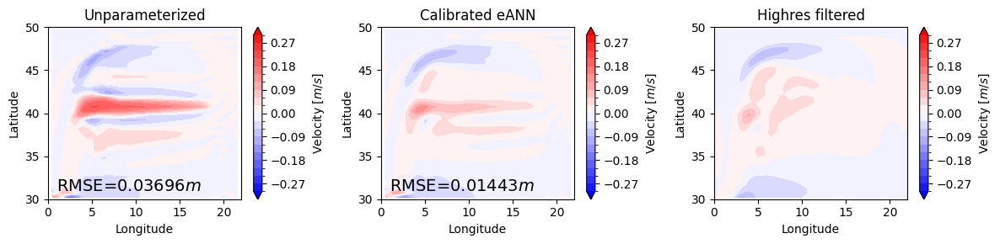

In [217]:
ds.plot_velocity(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'])

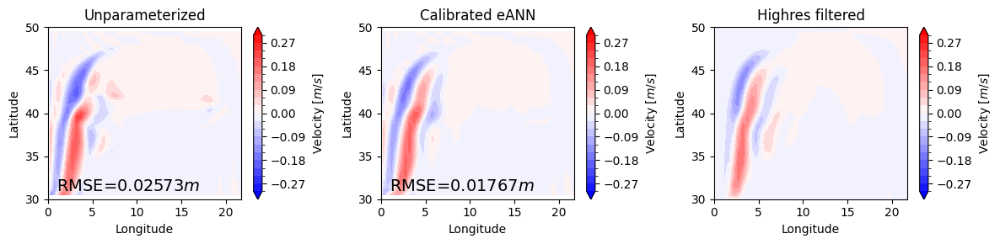

In [216]:
ds.plot_velocity(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'], key='v_mean')

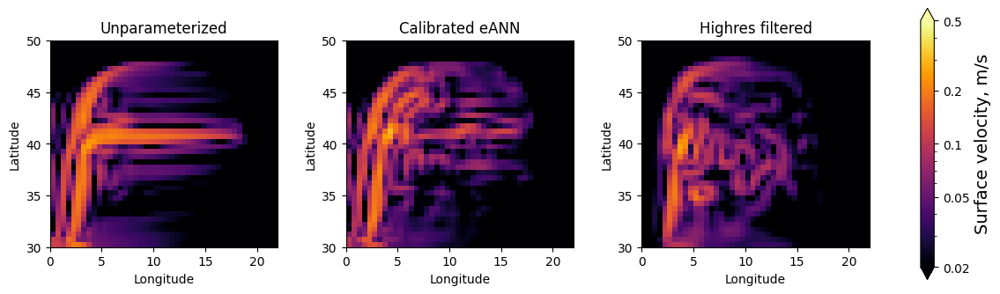

In [215]:
ds.plot_velocity_snapshot(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'], idx=-101)

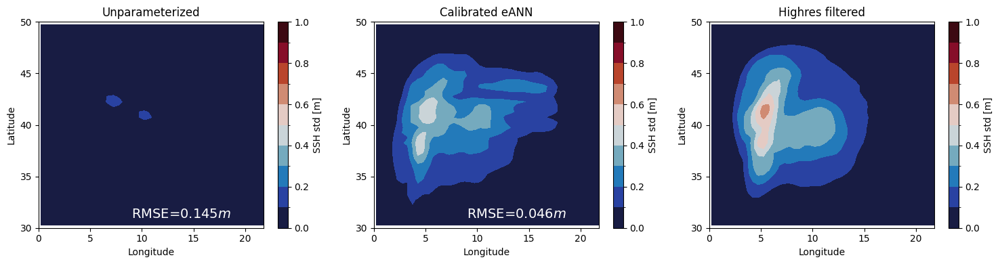

In [210]:
ds.plot_ssh_std(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'])

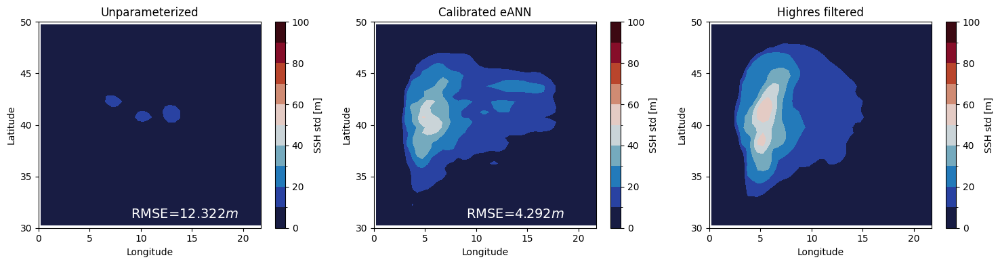

In [209]:
ds.plot_ssh_std(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], zi=1, labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'])

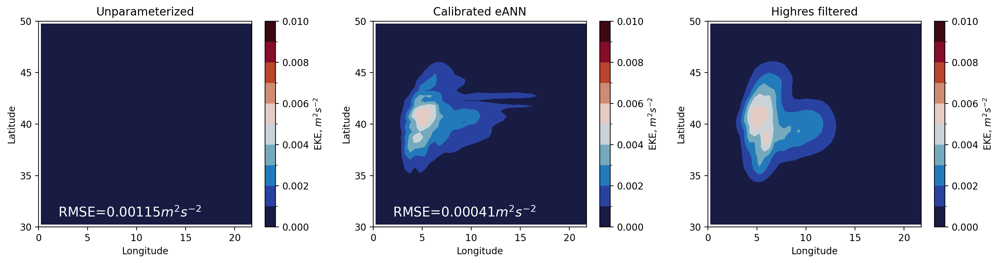

In [233]:
ds.plot_EKE(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'], target='R32_R2_FGR3')

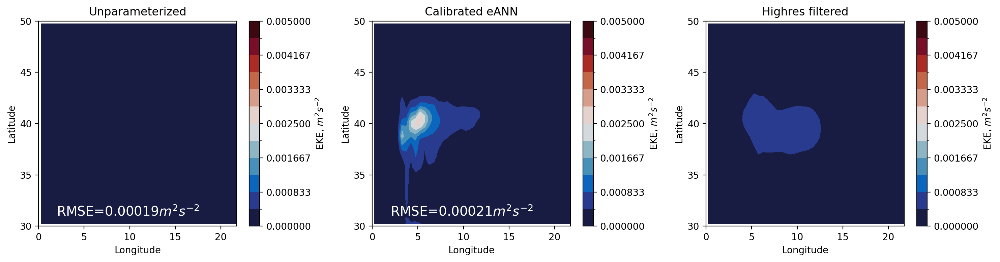

In [234]:
ds.plot_EKE(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'], target='R32_R2_FGR3', zl=1)

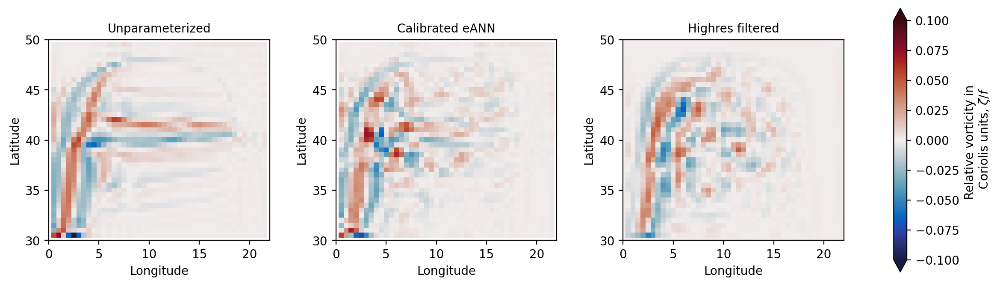

In [208]:
ds.plot_RV(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], vmax=0.1, idx=-20, labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'])

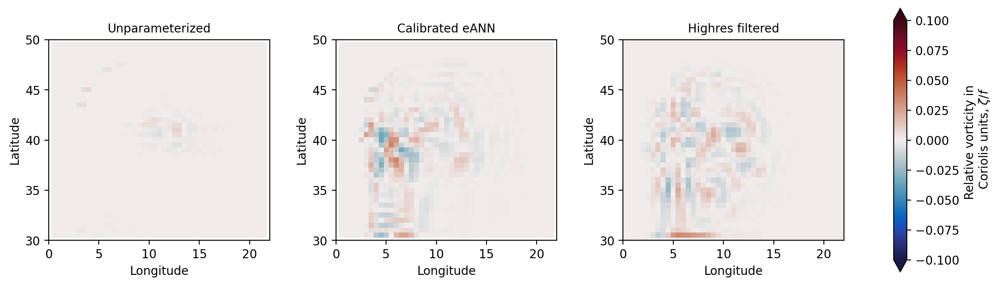

In [206]:
ds.plot_RV(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], vmax=0.1, idx=-20, zl=1, labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered'])

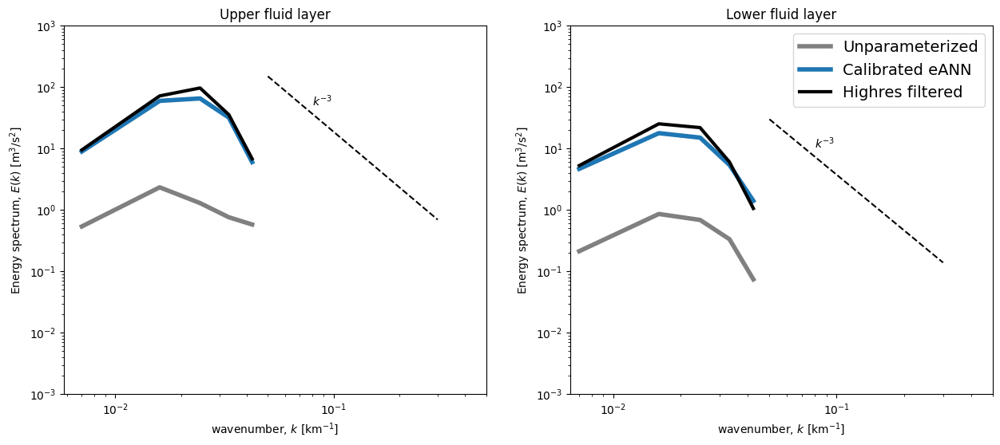

In [205]:
ds.plot_KE_spectrum(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered']);

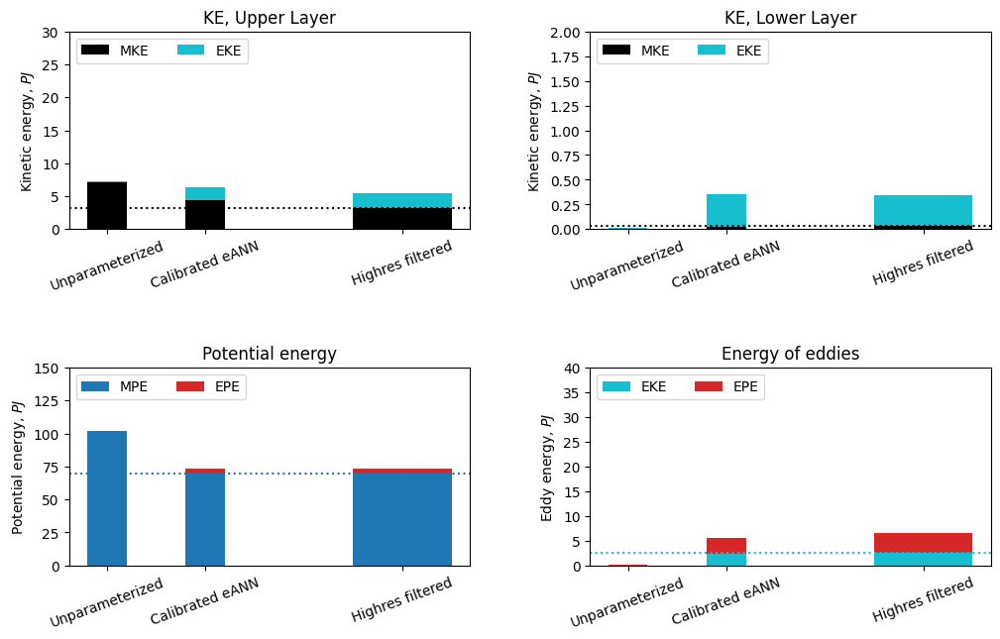

In [197]:
ds.plot_KE_PE(['R2', '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered']);

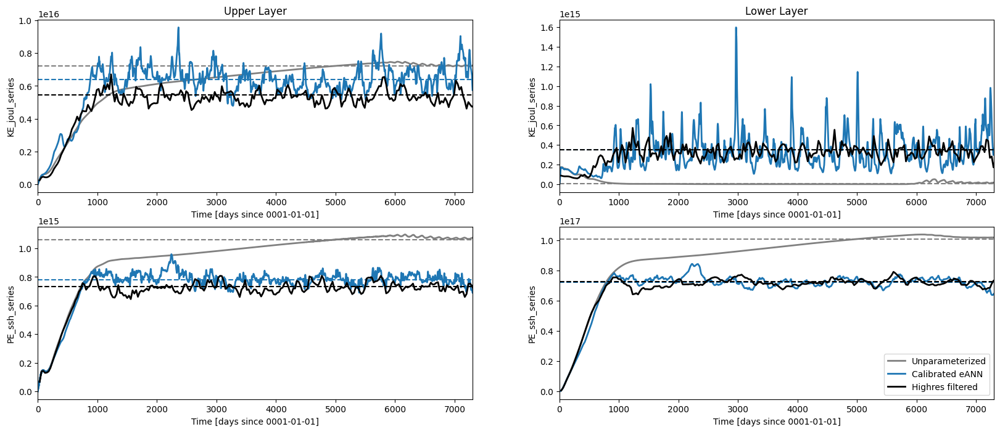

In [222]:
ds.plot_series(['R2',  '20-years-R2_FGR3_series_PJ_all_full_eANN-iteration-07-ens-member-68', 'R32_R2_FGR3'], tmax=365*20, labels=['Unparameterized', 'Calibrated eANN', 'Highres filtered']);

In [202]:
(metrics.APE_std_RMSE.sum('zi') + metrics.KE_std_RMSE.sum('zl')).isel(iter=7).argmin().values

array(68)

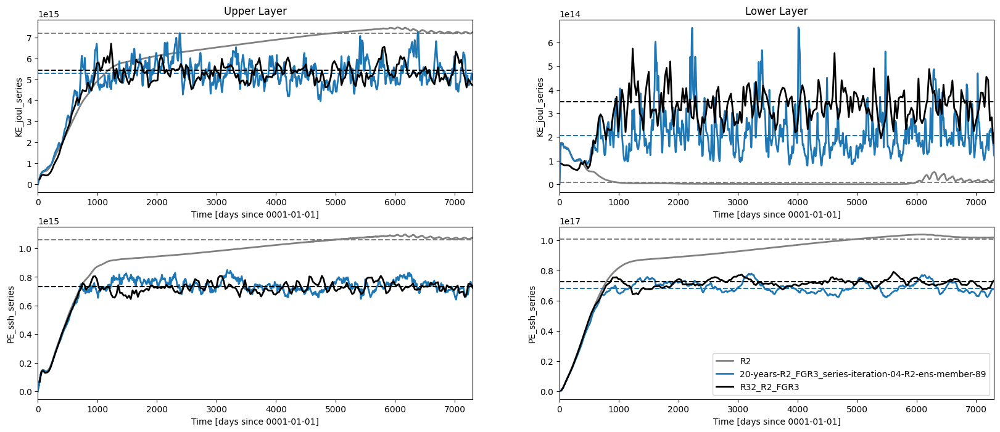

In [77]:
ds.plot_series(['R2',  '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'R32_R2_FGR3'], tmax=365*20);

# Test relative contribution of terms to the loss function

In [130]:
observation = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_series_loss.nc').astype('float64')

In [131]:
# Observation vector for EKI
# 1760*2 values of interface mean
y1 = (observation.e_mean).values.ravel()
# 1760*2 values of interface std
y2 = (observation.e_std).values.ravel()
# Additional 8 numbers for energetics
y3 = (observation.KE_mean).values.ravel()
y4 = (observation.KE_std).values.ravel()
y5 = (observation.APE_mean).values.ravel()
y6 = (observation.APE_std).values.ravel()
y = np.concatenate([y1,y2,y3,y4,y5,y6])

In [132]:
# Observation (+forward model) covariance matrix
# Factor here is only one because we assume perfect observations
# and noisy forward model
OBS_AND_FORWARD_FACTOR = 1.
# We multiply the noise variance of spatial field by this factor to
# reduce its contribution to the loss related to different number of elements (i.e., MSE instead of SSE)
var1 = (observation.e_mean_var_loss).values.ravel()
var2 = (observation.e_std_var_loss).values.ravel()
# Additional variances for energetics
var3 = (observation.KE_mean_var_loss).values.ravel()
var4 = (observation.KE_std_var_loss).values.ravel()
var5 = (observation.APE_mean_var_loss).values.ravel()
var6 = (observation.APE_std_var_loss).values.ravel()
# Observational noise for one resolution
Gamma = OBS_AND_FORWARD_FACTOR * np.concatenate([var1,var2,var3,var4,var5,var6])

In [133]:
ens_member = 68
iteration = 9
base_path = '/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years'
optimization_folder = 'R2_FGR3'
iteration_path = f'{base_path}/{optimization_folder}/iteration-{iteration:02d}'
RR = 'R2'

In [134]:
e = xr.open_mfdataset(f'{iteration_path}/{RR}/ens-member-{ens_member:02d}/output/prog_*.nc', decode_times=False).e.sel(Time=slice(365*10,None)).isel(zi=slice(0,2)).astype('float64')
e_mean = e.mean('Time')
e_std = e.std('Time')

series = xr.open_mfdataset(f'{iteration_path}/{RR}/ens-member-{ens_member:02d}/output/ocean.stats.nc', decode_times=False).astype('float64')
if len(series.Time) == 7301:
    series = series.sel(Time=slice(365*10,None)).isel(Interface=slice(0,2)).rename({'Layer': 'zl', 'Interface': 'zi'})[['KE', 'APE']]
    series = series * 1e-15 # Convert energetics to PJ
    KE_mean = series.KE.mean('Time').values
    KE_std = series.KE.std('Time').values
    APE_mean = series.APE.mean('Time').values
    APE_std = series.APE.std('Time').values
else:
    KE_mean = np.nan * np.zeros(2)
    KE_std = np.nan * np.zeros(2)
    APE_mean = np.nan * np.zeros(2)
    APE_std = np.nan * np.zeros(2)

In [135]:
y_prediction = []
y_prediction.append(e_mean.values.ravel())
y_prediction.append(e_std.values.ravel())
y_prediction.append(KE_mean)
y_prediction.append(KE_std)
y_prediction.append(APE_mean)
y_prediction.append(APE_std)
y_prediction = np.concatenate(y_prediction)

In [136]:
((y - y_prediction)**2 / Gamma).mean()

0.00032573216424604934

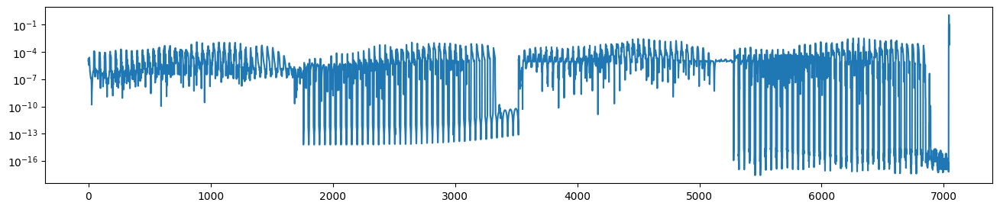

In [137]:
plt.figure(figsize=(16,3))
plt.semilogy((y - y_prediction)**2 / Gamma)
#plt.semilogy(((observation.e_mean[0] - e_mean[0])**2 / (observation.e_mean[0]**2).sum()).values.ravel())
#plt.semilogy(((observation.e_std[0] - e_std[0])**2 / (observation.e_std[0]**2).sum()).values.ravel())

In [138]:
loss = (y - y_prediction)**2 / Gamma

In [149]:
loss.mean()*1e+5

32.57321642460494

In [146]:
loss.sum()

2.295760293606156

In [139]:
loss[:1760].sum()

0.08337461763605988

In [140]:
loss[1760:1760*2].sum()

0.08159157466642866

In [141]:
loss[1760*2:1760*3].sum()

0.1755434680518929

In [142]:
loss[1760*3:1760*4].sum()

0.17041081566739855

In [143]:
np.set_printoptions(suppress=True, precision=6)
loss[1760*4:]

array([0.05839 , 0.203707, 1.165676, 0.239869, 0.008748, 0.000576,
       0.10515 , 0.002724])

In [144]:
loss[1760*4:].mean()

0.22310497719804692

# Analysis of the calibration with APE/KE loss

In [219]:
#metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series/metrics.nc').isel(res=0)
metrics = xr.open_mfdataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_200_full_eANN/metrics*')

observation = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_series_loss.nc').astype('float64')

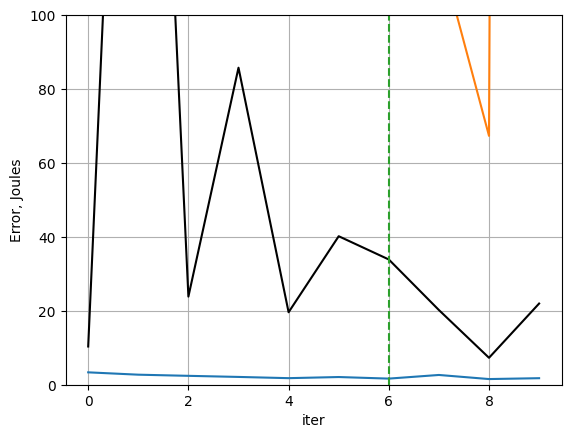

In [220]:
ndegrees = 44*40*2*6 + 8
(metrics.WMSE_MAP * ndegrees).plot(color='k')
(metrics.WMSE.min('ens') * ndegrees).plot()
(metrics.WMSE.max('ens') * ndegrees).plot()
plt.ylim([0,100])
plt.grid()
plt.ylabel('Error, Joules')
plt.axvline(x=6, ls='--', color='tab:green')

In [186]:
metrics.WMSE.isel(iter=7).argmin().values

array(148)

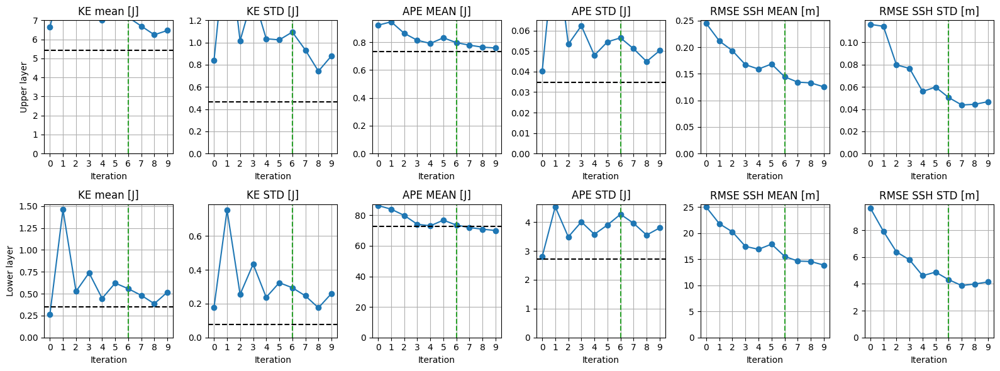

In [221]:
plt.figure(figsize=(16,6))


plt.subplot(2,6,1)
metrics.KE_mean.isel(zl=0).mean('ens').plot(marker='o')
plt.axhline(y=observation.KE_mean.isel(zl=0), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('KE mean [J]')
plt.ylabel('Upper layer')
plt.ylim([0,7])


plt.subplot(2,6,2)
metrics.KE_std.isel(zl=0).mean('ens').plot(marker='o')
plt.axhline(y=observation.KE_std.isel(zl=0), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('KE STD [J]')
plt.ylabel('')
plt.ylim([0,1.2])

plt.subplot(2,6,3)
metrics.APE_mean.isel(zi=0).mean('ens').plot(marker='o')
plt.axhline(y=observation.APE_mean.isel(zi=0), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('APE MEAN [J]')
plt.ylabel('')

plt.subplot(2,6,4)
metrics.APE_std.isel(zi=0).mean('ens').plot(marker='o')
plt.axhline(y=observation.APE_std.isel(zi=0), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('APE STD [J]')
plt.ylabel('')
plt.ylim([0,0.065])

plt.subplot(2,6,5)
metrics.e_mean_RMSE.isel(zi=0).mean('ens').plot(marker='o')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('RMSE SSH MEAN [m]')
plt.ylabel('')

plt.subplot(2,6,6)
metrics.e_std_RMSE.isel(zi=0).mean('ens').plot(marker='o')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('RMSE SSH STD [m]')
plt.ylabel('')

plt.subplot(2,6,7)
metrics.KE_mean.isel(zl=1).mean('ens').plot(marker='o')
plt.axhline(y=observation.KE_mean.isel(zl=1), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('KE mean [J]')
plt.ylabel('Lower layer')


plt.subplot(2,6,8)
metrics.KE_std.isel(zl=1).mean('ens').plot(marker='o')
plt.axhline(y=observation.KE_std.isel(zl=1), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('KE STD [J]')
plt.ylabel('')

plt.subplot(2,6,9)
metrics.APE_mean.isel(zi=1).mean('ens').plot(marker='o')
plt.axhline(y=observation.APE_mean.isel(zi=1), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('APE MEAN [J]')
plt.ylabel('')

plt.subplot(2,6,10)
metrics.APE_std.isel(zi=1).mean('ens').plot(marker='o')
plt.axhline(y=observation.APE_std.isel(zi=1), color='k', ls='--')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('APE STD [J]')
plt.ylabel('')

plt.subplot(2,6,11)
metrics.e_mean_RMSE.isel(zi=1).mean('ens').plot(marker='o')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('RMSE SSH MEAN [m]')
plt.ylabel('')

plt.subplot(2,6,12)
metrics.e_std_RMSE.isel(zi=1).mean('ens').plot(marker='o')
plt.title('')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.title('RMSE SSH STD [m]')
plt.ylabel('')


for j in range(1,13):
    plt.subplot(2,6,j)
    plt.axvline(x=6, ls='--', color='tab:green')

plt.tight_layout()



Slope: 0.5640555738411028, Intercept: -2.525550496801304


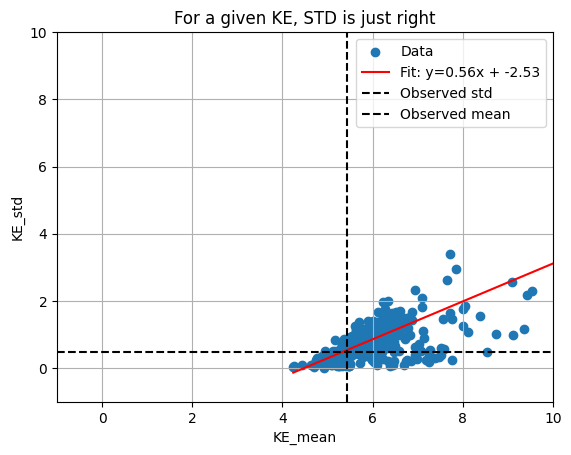

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Extract x and y data
x = metrics.KE_mean.isel(zl=0).values.ravel()
y = metrics.KE_std.isel(zl=0).values.ravel()
mask = ~np.isnan(x)
x = x[mask]
y = y[mask]


# Fit linear model y = m*x + b
coeffs = np.polyfit(x, y, 1)  # degree 1 polynomial
m, b = coeffs
print(f"Slope: {m}, Intercept: {b}")

# Generate points for the fitted line
x_fit = np.linspace(min(x), max(x), 100)
y_fit = m * x_fit + b

# Plot
plt.scatter(x, y, label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y={m:.2f}x + {b:.2f}')
plt.axhline(y=observation.KE_std.isel(zl=0), color='k', ls='--', label='Observed std')
plt.axvline(x=observation.KE_mean.isel(zl=0), color='k', ls='--', label='Observed mean')

plt.xlim([-1, 10])
plt.ylim([-1, 10])
plt.grid()
plt.legend()
plt.xlabel('KE_mean')
plt.ylabel('KE_std')
plt.title('For a given KE, STD is just right')
plt.show()


Slope: 0.6899107011192158, Intercept: -0.04487984067901949


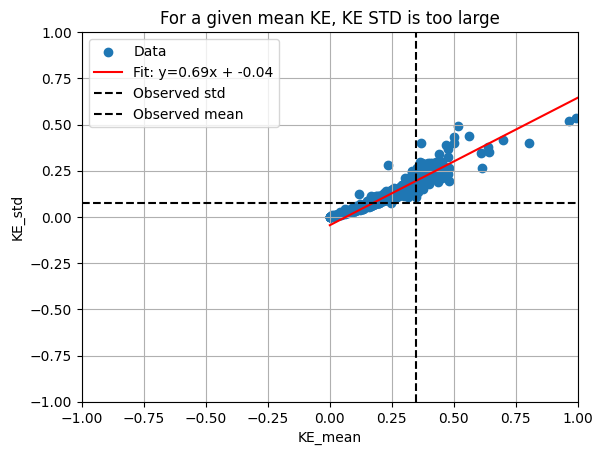

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Extract x and y data
x = metrics.KE_mean.isel(zl=1).values.ravel()
y = metrics.KE_std.isel(zl=1).values.ravel()
mask = ~np.isnan(x)
x = x[mask]
y = y[mask]

# Fit linear model y = m*x + b
coeffs = np.polyfit(x, y, 1)  # degree 1 polynomial
m, b = coeffs
print(f"Slope: {m}, Intercept: {b}")

# Generate points for the fitted line
x_fit = np.linspace(min(x), max(x), 100)
y_fit = m * x_fit + b

# Plot
plt.scatter(x, y, label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y={m:.2f}x + {b:.2f}')
plt.axhline(y=observation.KE_std.isel(zl=1), color='k', ls='--', label='Observed std')
plt.axvline(x=observation.KE_mean.isel(zl=1), color='k', ls='--', label='Observed mean')

plt.xlim([-1, 1])
plt.ylim([-1, 1])
plt.grid()
plt.legend()
plt.xlabel('KE_mean')
plt.ylabel('KE_std')
plt.title('For a given mean KE, KE STD is too large')
plt.show()


Slope: 0.34421491665095205, Intercept: -0.21309476641548802


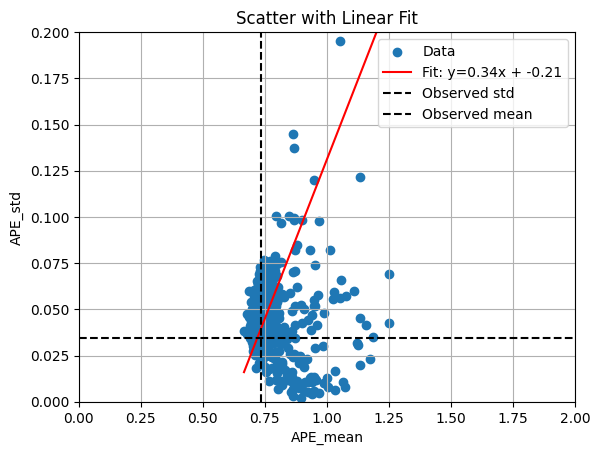

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extract x and y data
x = metrics.APE_mean.isel(zi=0).values.ravel()
y = metrics.APE_std.isel(zi=0).values.ravel()
mask = ~np.isnan(x)
x = x[mask]
y = y[mask]


# Fit linear model y = m*x + b
coeffs = np.polyfit(x, y, 1)  # degree 1 polynomial
m, b = coeffs
print(f"Slope: {m}, Intercept: {b}")

# Generate points for the fitted line
x_fit = np.linspace(min(x), max(x), 100)
y_fit = m * x_fit + b

# Plot
plt.scatter(x, y, label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y={m:.2f}x + {b:.2f}')
plt.axhline(y=observation.APE_std.isel(zi=0), color='k', ls='--', label='Observed std')
plt.axvline(x=observation.APE_mean.isel(zi=0), color='k', ls='--', label='Observed mean')

plt.xlim([0, 2])
plt.ylim([0, 0.2])
plt.grid()
plt.legend()
plt.xlabel('APE_mean')
plt.ylabel('APE_std')
plt.title('For a given APE mean, STD is not defined')
plt.show()


Slope: 0.06608913117257977, Intercept: -0.5201291668690725


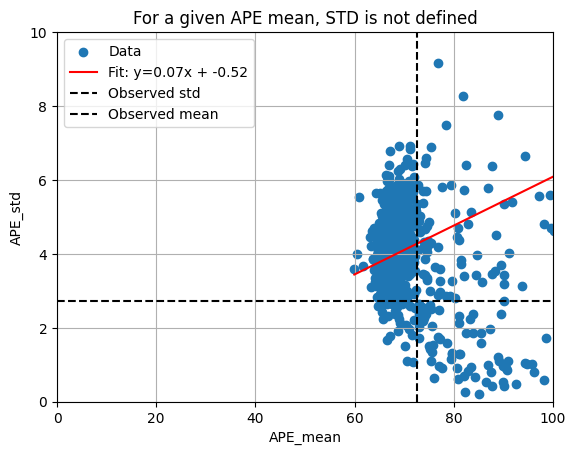

In [45]:
import numpy as np
import matplotlib.pyplot as plt

# Extract x and y data
x = metrics.APE_mean.isel(zi=1).values.ravel()
y = metrics.APE_std.isel(zi=1).values.ravel()
mask = ~np.isnan(x)
x = x[mask]
y = y[mask]


# Fit linear model y = m*x + b
coeffs = np.polyfit(x, y, 1)  # degree 1 polynomial
m, b = coeffs
print(f"Slope: {m}, Intercept: {b}")

# Generate points for the fitted line
x_fit = np.linspace(min(x), max(x), 100)
y_fit = m * x_fit + b

# Plot
plt.scatter(x, y, label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y={m:.2f}x + {b:.2f}')
plt.axhline(y=observation.APE_std.isel(zi=1), color='k', ls='--', label='Observed std')
plt.axvline(x=observation.APE_mean.isel(zi=1), color='k', ls='--', label='Observed mean')

plt.xlim([0, 100])
plt.ylim([0, 10])
plt.grid()
plt.legend()
plt.xlabel('APE_mean')
plt.ylabel('APE_std')
plt.title('For a given APE mean, STD is not defined')
plt.show()


Slope: 0.04366952480879257, Intercept: 0.49514688170553844


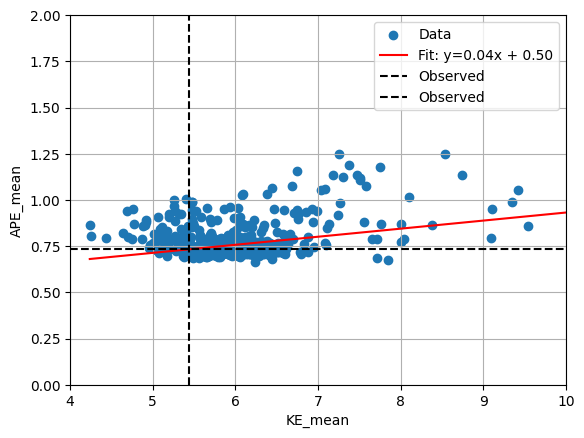

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extract x and y data
x = metrics.KE_mean.isel(zl=0).values.ravel()
y = metrics.APE_mean.isel(zi=0).values.ravel()
mask = ~np.isnan(x)
x = x[mask]
y = y[mask]


# Fit linear model y = m*x + b
coeffs = np.polyfit(x, y, 1)  # degree 1 polynomial
m, b = coeffs
print(f"Slope: {m}, Intercept: {b}")

# Generate points for the fitted line
x_fit = np.linspace(min(x), max(x), 100)
y_fit = m * x_fit + b

# Plot
plt.scatter(x, y, label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y={m:.2f}x + {b:.2f}')
plt.axhline(y=observation.APE_mean.isel(zi=0), color='k', ls='--', label='Observed')
plt.axvline(x=observation.KE_mean.isel(zl=0), color='k', ls='--', label='Observed')

plt.xlim([4, 10])
plt.ylim([0, 2])
plt.grid()
plt.legend()
plt.xlabel('KE_mean')
plt.ylabel('APE_mean')
plt.title('For a given KE mean, APE mean can be tuned correctly')
plt.show()


In [44]:
metrics.WMSE.isel(iter=4).argmin()

<xarray.DataArray 'WMSE' ()> Size: 8B
array(89)

In [9]:
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6//Wenda-WENO', additional_subfolder='output')

# Pareto optimal in 20-year and 20-day metrics

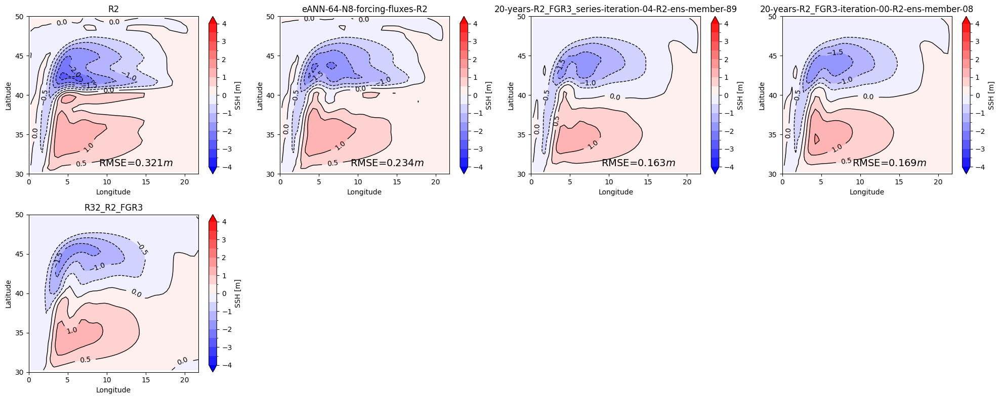

In [14]:
ds.plot_ssh(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', '20-years-R2_FGR3-iteration-00-R2-ens-member-08', 'R32_R2_FGR3'], ncols=4)

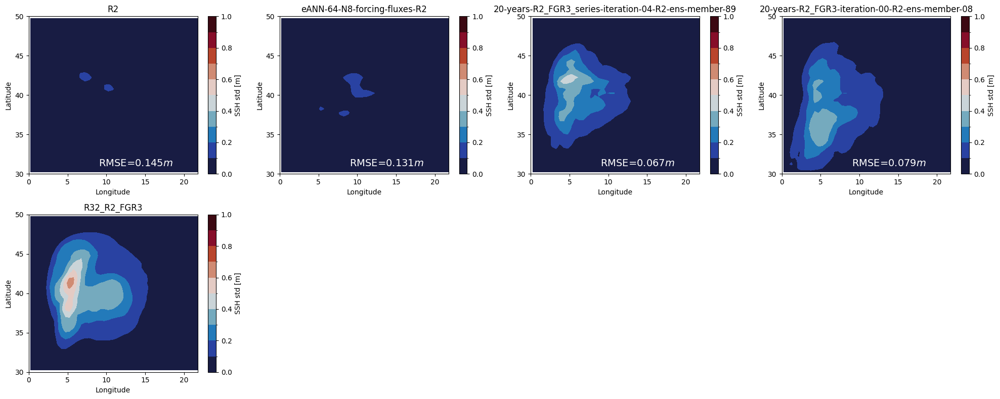

In [15]:
ds.plot_ssh_std(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', '20-years-R2_FGR3-iteration-00-R2-ens-member-08', 'R32_R2_FGR3'], ncols=4)

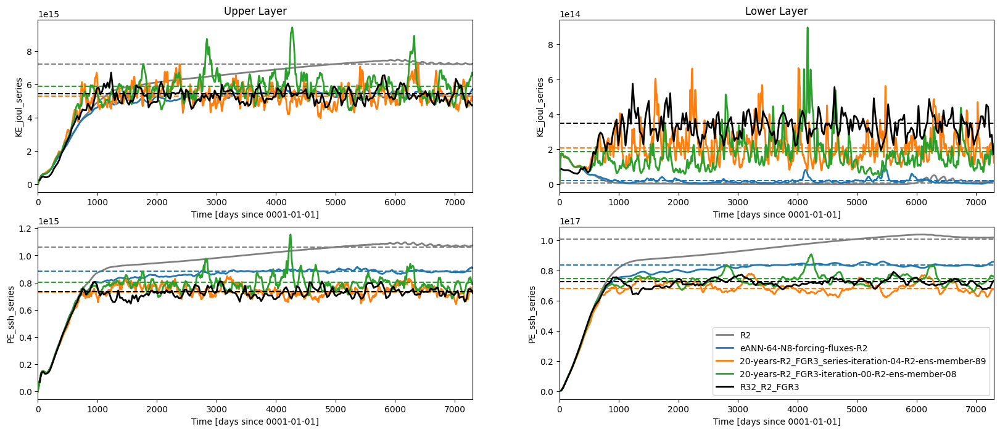

In [18]:
ds.plot_series(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', '20-years-R2_FGR3-iteration-00-R2-ens-member-08', 'R32_R2_FGR3'], tmax=365*20)

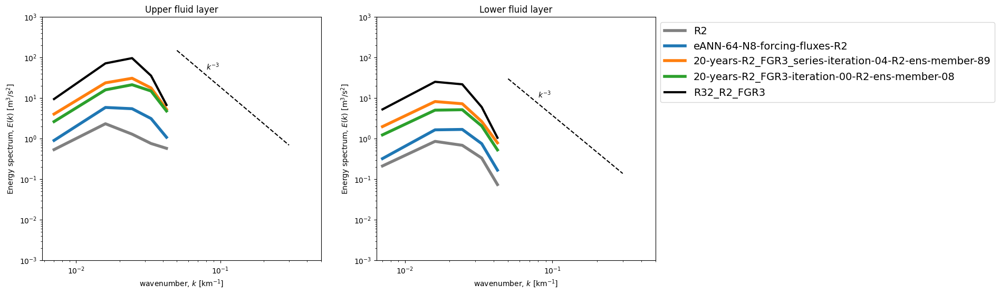

In [21]:
ds.plot_KE_spectrum(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', '20-years-R2_FGR3-iteration-00-R2-ens-member-08', 'R32_R2_FGR3']);

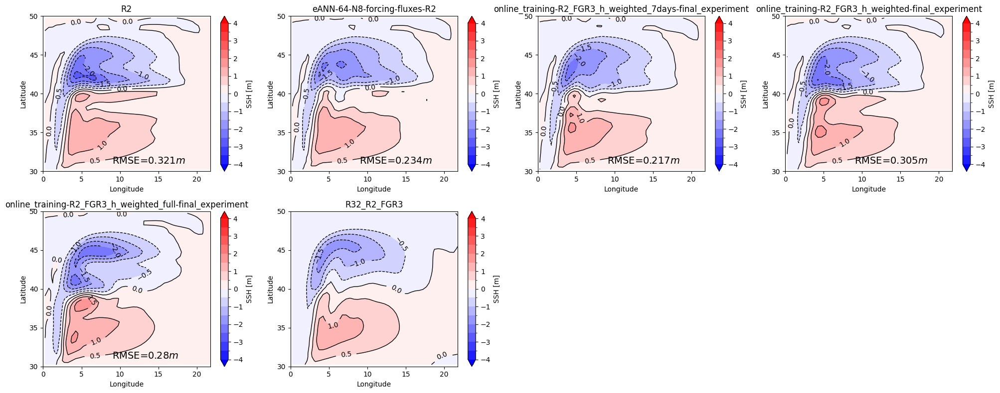

In [11]:
ds.plot_ssh(['R2',  'eANN-64-N8-forcing-fluxes-R2', 'online_training-R2_FGR3_h_weighted_7days-final_experiment',  'online_training-R2_FGR3_h_weighted-final_experiment', 
'online_training-R2_FGR3_h_weighted_full-final_experiment', 'R32_R2_FGR3'], ncols=4)

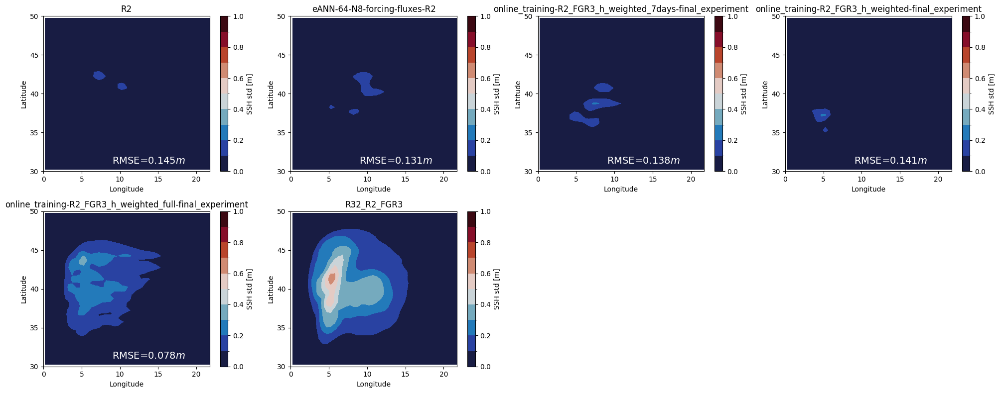

In [12]:
ds.plot_ssh_std(['R2',  'eANN-64-N8-forcing-fluxes-R2', 'online_training-R2_FGR3_h_weighted_7days-final_experiment',  'online_training-R2_FGR3_h_weighted-final_experiment', 
'online_training-R2_FGR3_h_weighted_full-final_experiment', 'R32_R2_FGR3'], ncols=4)

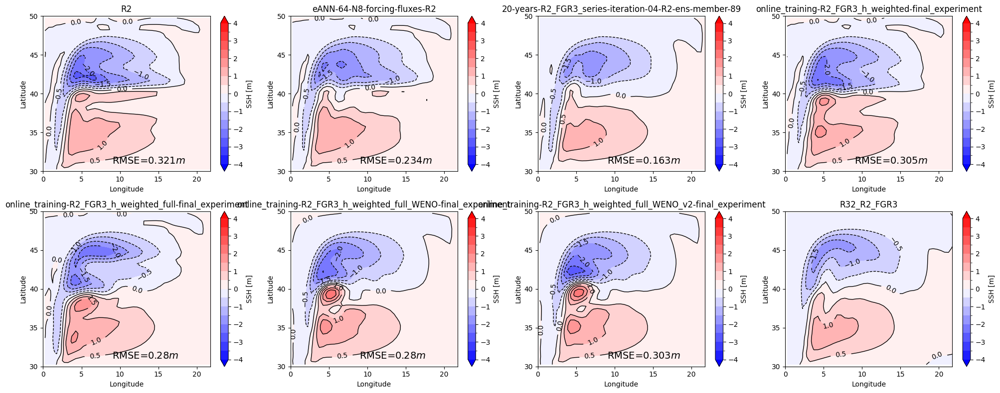

In [8]:
ds.plot_ssh(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted-final_experiment', 
'online_training-R2_FGR3_h_weighted_full-final_experiment', 
'online_training-R2_FGR3_h_weighted_full_WENO-final_experiment',
 'online_training-R2_FGR3_h_weighted_full_WENO_v2-final_experiment', 'R32_R2_FGR3'], ncols=4)

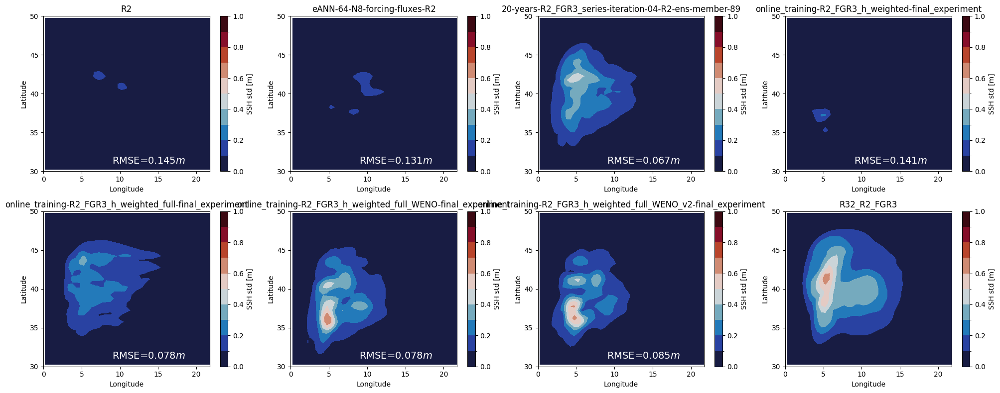

In [9]:
ds.plot_ssh_std(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted-final_experiment', 
'online_training-R2_FGR3_h_weighted_full-final_experiment', 
'online_training-R2_FGR3_h_weighted_full_WENO-final_experiment',
'online_training-R2_FGR3_h_weighted_full_WENO_v2-final_experiment', 
'R32_R2_FGR3'], ncols=4)

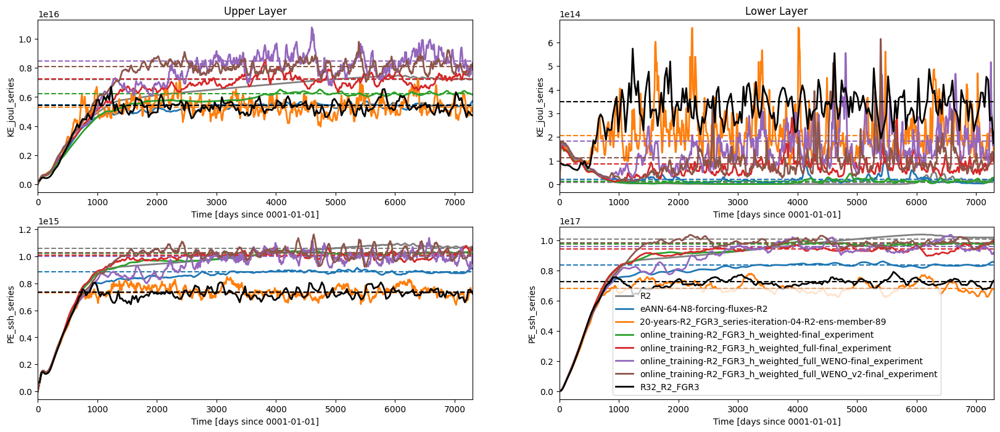

In [12]:
ds.plot_series(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted-final_experiment', 
'online_training-R2_FGR3_h_weighted_full-final_experiment', 
'online_training-R2_FGR3_h_weighted_full_WENO-final_experiment',
'online_training-R2_FGR3_h_weighted_full_WENO_v2-final_experiment', 
'R32_R2_FGR3'], tmax=7300)

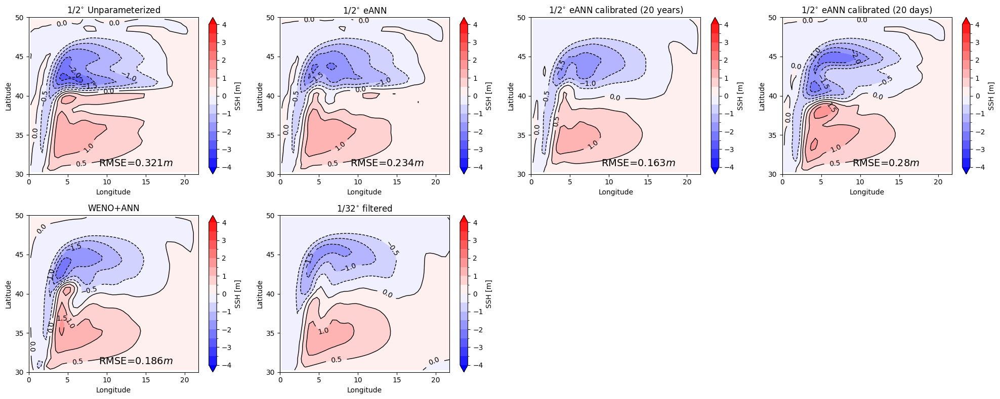

In [10]:
ds.plot_ssh(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=4)

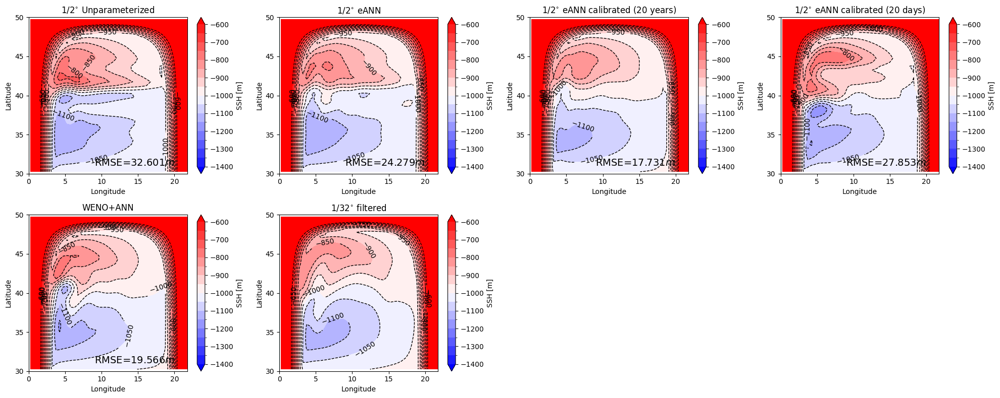

In [11]:
ds.plot_ssh(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=4, zi=1)

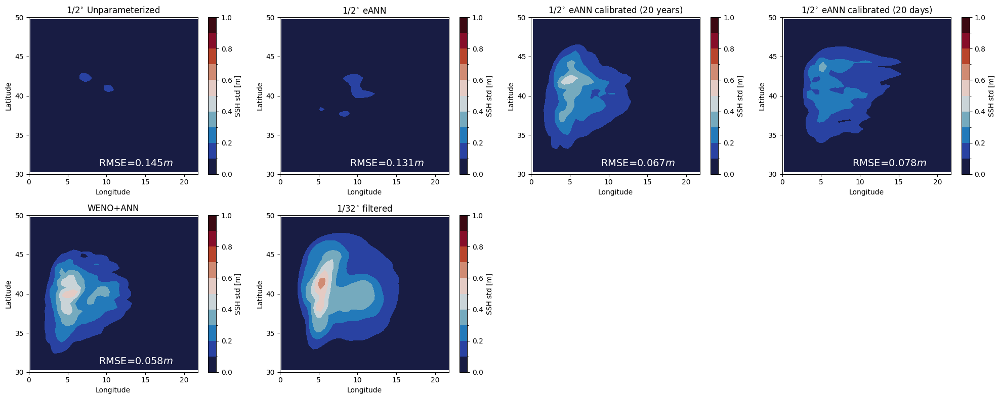

In [12]:
ds.plot_ssh_std(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=4)

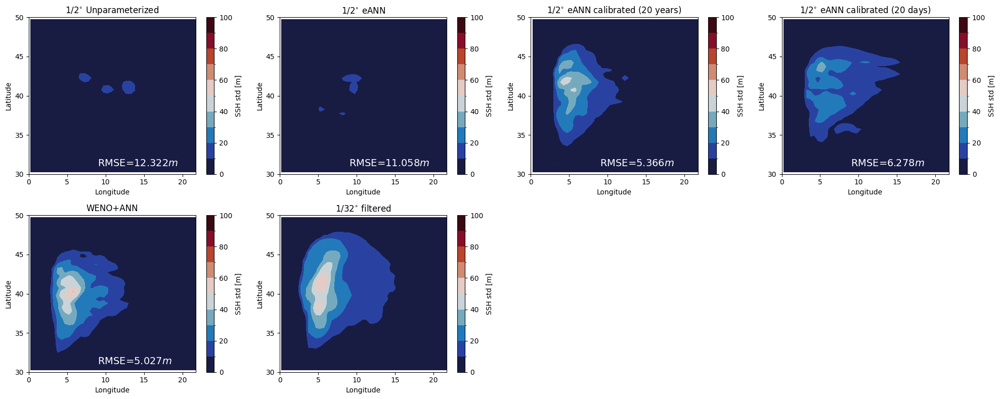

In [13]:
ds.plot_ssh_std(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=4, zi=1)

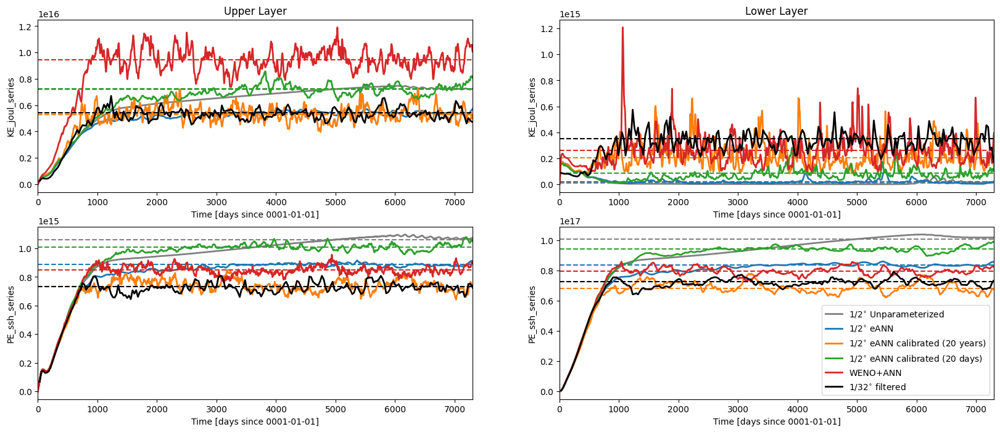

In [14]:
ds.plot_series(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], tmax=365*20)


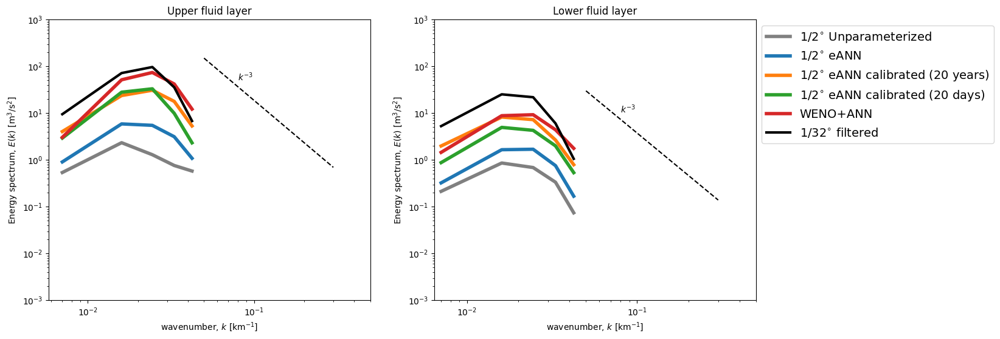

In [15]:
ds.plot_KE_spectrum(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered']);


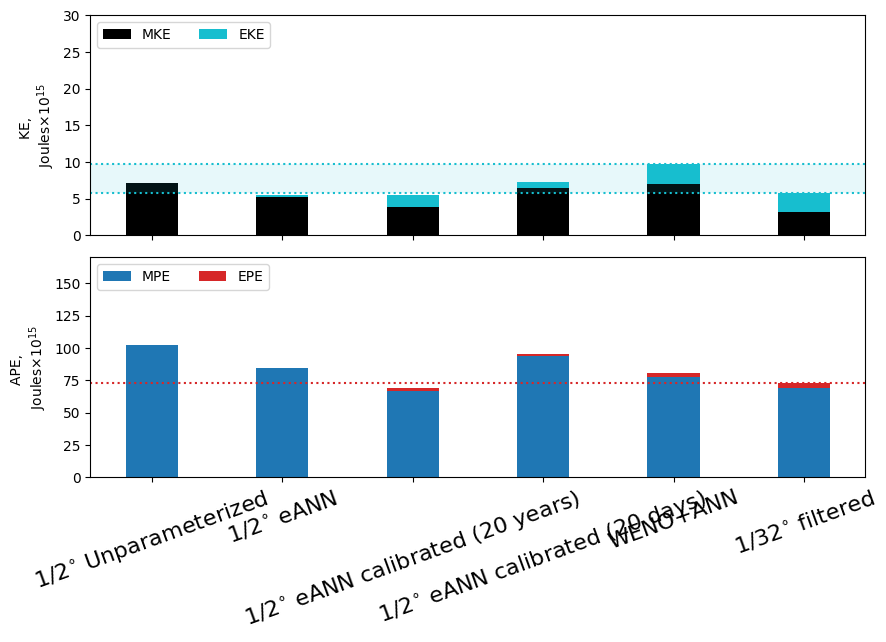

In [16]:
ds.plot_KE_PE_simpler(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered']);


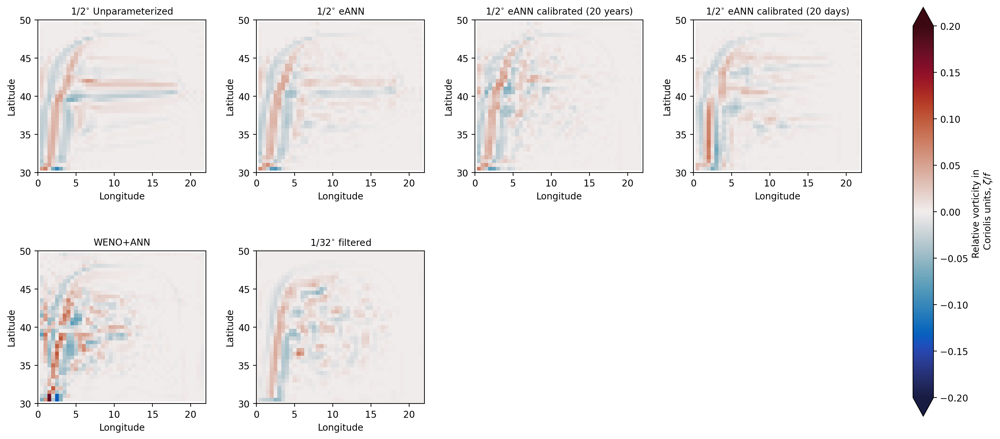

In [17]:
ds.plot_RV(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=4, idx=170)

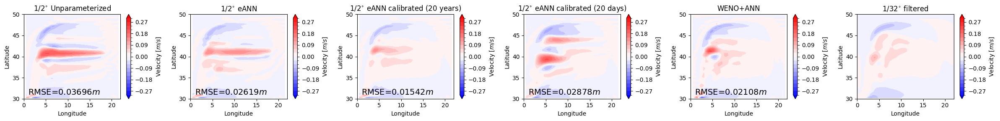

In [18]:
ds.plot_velocity(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], key='u_mean')

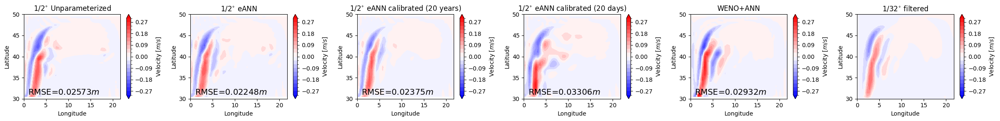

In [19]:
ds.plot_velocity(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], key='v_mean')

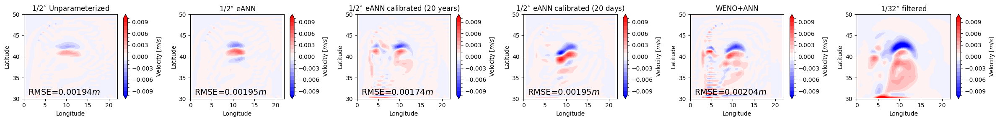

In [20]:
ds.plot_velocity(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], key='u_mean', zl=1, vmax=0.01)

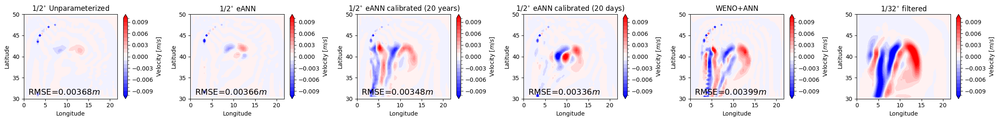

In [21]:
ds.plot_velocity(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], key='v_mean', zl=1, vmax=0.01)

In [22]:
def plot(idx=0):
    ds.plot_velocity_snapshot(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'online_training-R2_FGR3_h_weighted_full-final_experiment', 'WENO7-ANN-FGR2-EXP1-R2', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated (20 years)', '$1/2^{\circ}$ eANN calibrated (20 days)', 'WENO+ANN', '$1/32^{\circ}$ filtered'], ncols=3, idx=idx)

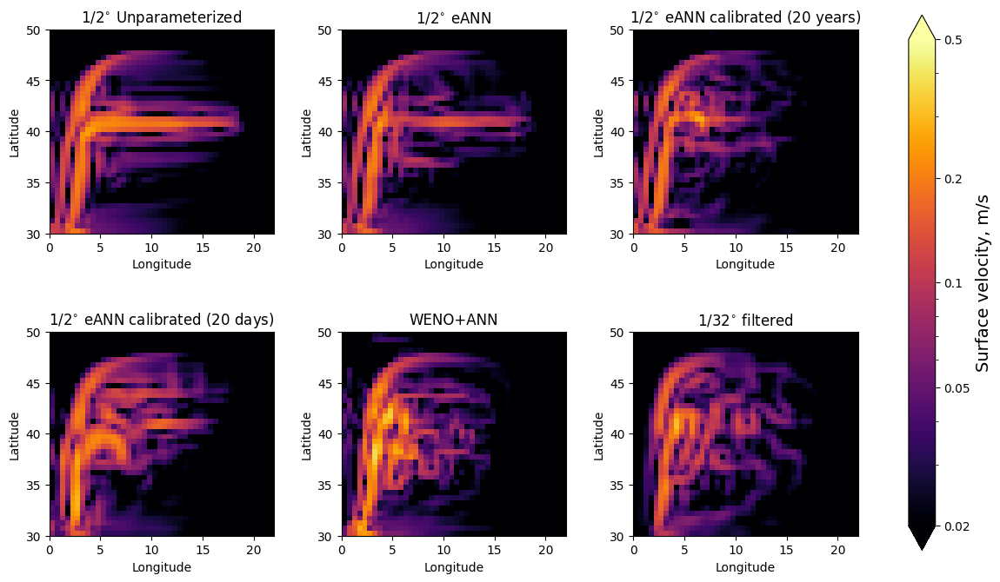

In [23]:
plot(200)

In [24]:
create_animation_ffmpeg(plot, idx=range(100,200), filename='velocity_comparison.mp4', FPS=15)

Frames already exists in folder .ffmpeg/velocity_comparison
Savefig .ffmpeg/velocity_comparison/frame-0.png
Savefig .ffmpeg/velocity_comparison/frame-1.png
Savefig .ffmpeg/velocity_comparison/frame-2.png
Savefig .ffmpeg/velocity_comparison/frame-3.png
Savefig .ffmpeg/velocity_comparison/frame-4.png
Savefig .ffmpeg/velocity_comparison/frame-5.png
Savefig .ffmpeg/velocity_comparison/frame-6.png
Savefig .ffmpeg/velocity_comparison/frame-7.png
Savefig .ffmpeg/velocity_comparison/frame-8.png
Savefig .ffmpeg/velocity_comparison/frame-9.png
Savefig .ffmpeg/velocity_comparison/frame-10.png
Savefig .ffmpeg/velocity_comparison/frame-11.png
Savefig .ffmpeg/velocity_comparison/frame-12.png
Savefig .ffmpeg/velocity_comparison/frame-13.png
Savefig .ffmpeg/velocity_comparison/frame-14.png
Savefig .ffmpeg/velocity_comparison/frame-15.png
Savefig .ffmpeg/velocity_comparison/frame-16.png
Savefig .ffmpeg/velocity_comparison/frame-17.png
Savefig .ffmpeg/velocity_comparison/frame-18.png
Savefig .ffmpeg/vel

ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-l

In [132]:
def plot(idx=0):
    ds.plot_ssh_snapshot(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated', '$1/32^{\circ}$ filtered'], ncols=2, idx=idx)

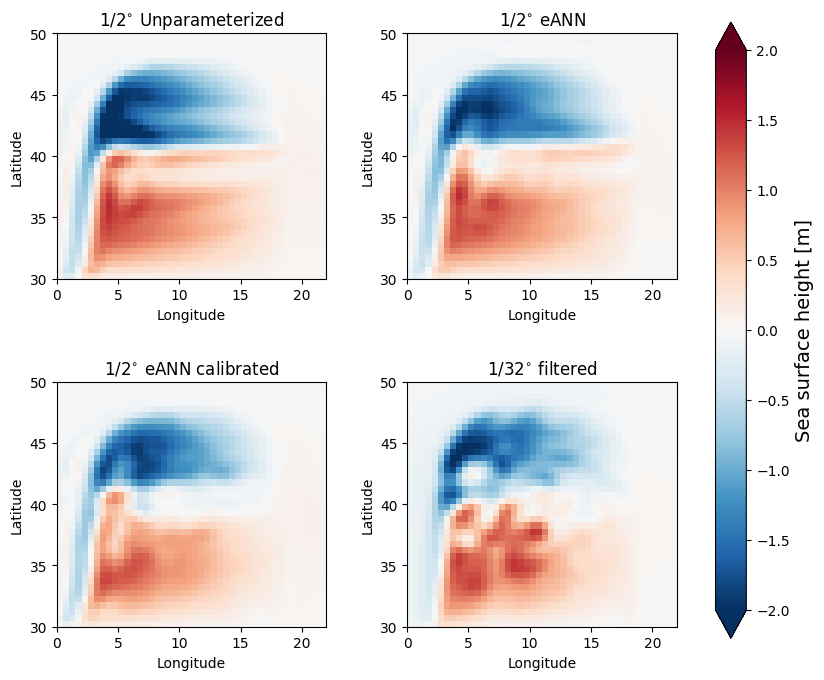

In [137]:
plot(idx=100)

In [138]:
create_animation_ffmpeg(plot, idx=range(0,243), filename='ssh_comparison.mp4', FPS=15)

Savefig .ffmpeg/ssh_comparison/frame-0.png
Savefig .ffmpeg/ssh_comparison/frame-1.png7057
Savefig .ffmpeg/ssh_comparison/frame-2.png90234
Savefig .ffmpeg/ssh_comparison/frame-3.png96994
Savefig .ffmpeg/ssh_comparison/frame-4.png38525
Savefig .ffmpeg/ssh_comparison/frame-5.png73095
Savefig .ffmpeg/ssh_comparison/frame-6.png9703
Savefig .ffmpeg/ssh_comparison/frame-7.png88428
Savefig .ffmpeg/ssh_comparison/frame-8.png7564
Savefig .ffmpeg/ssh_comparison/frame-9.png11166
Savefig .ffmpeg/ssh_comparison/frame-10.png9952
Savefig .ffmpeg/ssh_comparison/frame-11.png69182
Savefig .ffmpeg/ssh_comparison/frame-12.png85678
Savefig .ffmpeg/ssh_comparison/frame-13.png01767
Savefig .ffmpeg/ssh_comparison/frame-14.png37313
Savefig .ffmpeg/ssh_comparison/frame-15.png2539
Savefig .ffmpeg/ssh_comparison/frame-16.png39014
Savefig .ffmpeg/ssh_comparison/frame-17.png73054
Savefig .ffmpeg/ssh_comparison/frame-18.png41788
Savefig .ffmpeg/ssh_comparison/frame-19.png774
Savefig .ffmpeg/ssh_comparison/frame-20.pn

ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-l

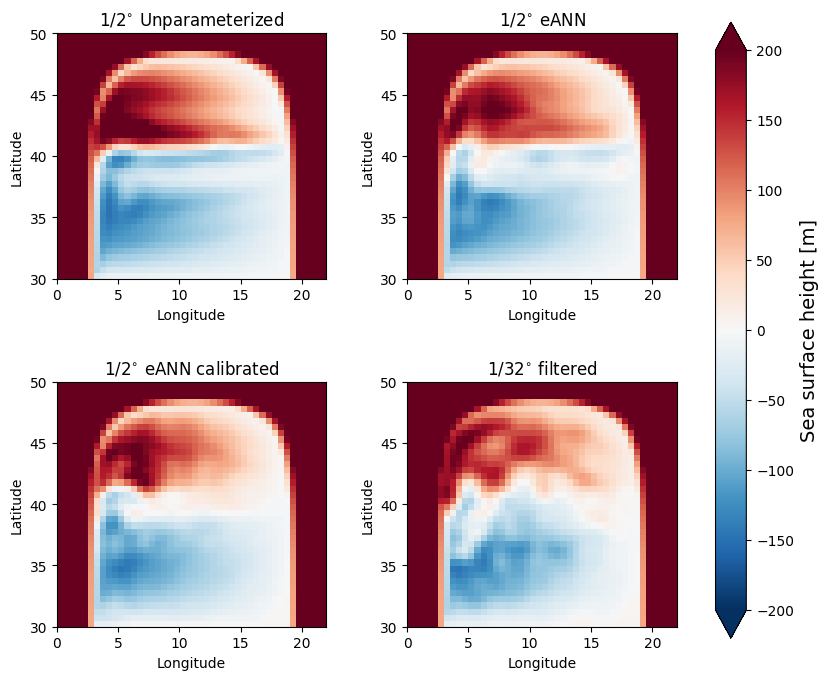

In [151]:
ds.plot_ssh_snapshot(['R2', 'eANN-64-N8-forcing-fluxes-R2', '20-years-R2_FGR3_series-iteration-04-R2-ens-member-89', 'R32_R2_FGR3'], labels=['$1/2^{\circ}$ Unparameterized', '$1/2^{\circ}$ eANN', '$1/2^{\circ}$ eANN calibrated', '$1/32^{\circ}$ filtered'], ncols=2, idx=200, zi=1, vmax=200)

# PDFs

[]

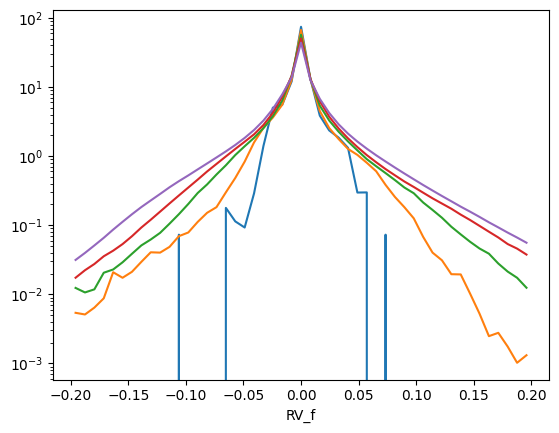

In [193]:
ds['R2'].pdf_RV.plot()
ds['R4'].pdf_RV.plot()
ds['R8'].pdf_RV.plot()
ds['R16'].pdf_RV.plot()
ds['R64'].pdf_RV.plot()
plt.semilogy()

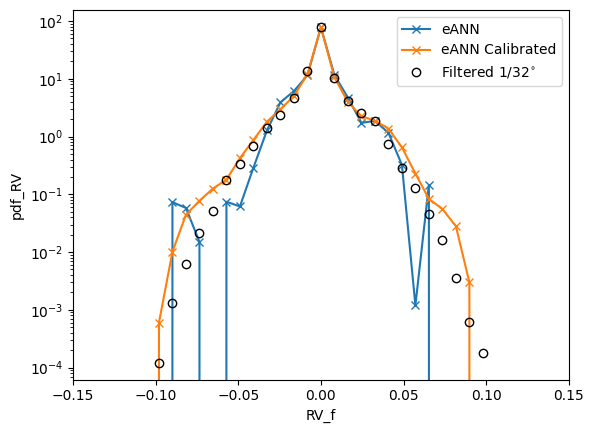

In [220]:
ds['eANN-64-N8-forcing-fluxes-R2'].pdf_RV.plot(label='eANN', ls='-', marker='x')
ds['20-years-R2_FGR3_series-iteration-04-R2-ens-member-89'].pdf_RV.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R32_R2_FGR3'].pdf_RV.plot(color='k', label='Filtered $1/32^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.xlim([-0.15,0.15])
plt.legend()

(0.001, 4.392938348943676)

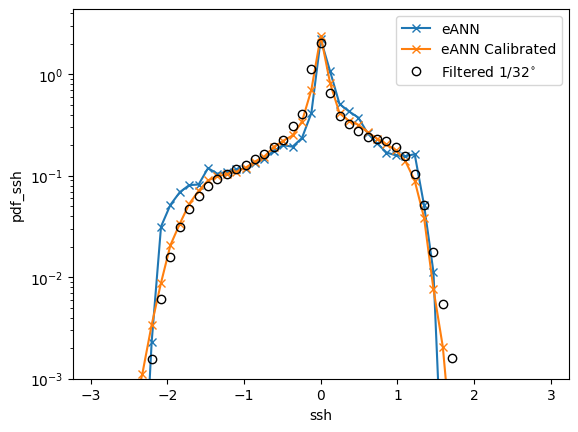

In [218]:
ds['eANN-64-N8-forcing-fluxes-R2'].pdf_ssh.plot(label='eANN', ls='-', marker='x')
ds['20-years-R2_FGR3_series-iteration-04-R2-ens-member-89'].pdf_ssh.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R32_R2_FGR3'].pdf_ssh.plot(color='k', label='Filtered $1/32^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()
#plt.xlim([-2.5,2.5])
plt.ylim([1e-3,None])

(-0.3, 0.3)

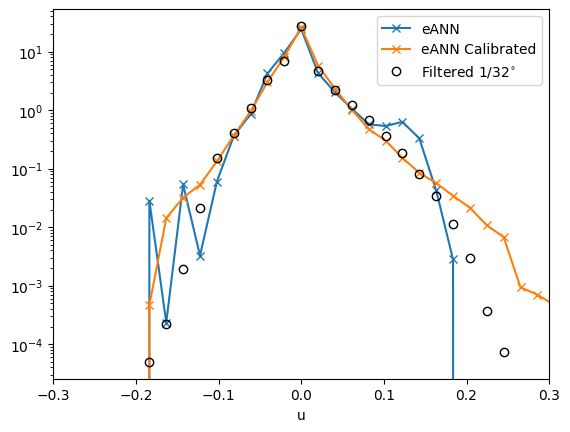

In [214]:
ds['eANN-64-N8-forcing-fluxes-R2'].pdf_u.plot(label='eANN', ls='-', marker='x')
ds['20-years-R2_FGR3_series-iteration-04-R2-ens-member-89'].pdf_u.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R32_R2_FGR3'].pdf_u.plot(color='k', label='Filtered $1/32^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()
plt.xlim([-0.3,0.3])

(-0.3, 0.3)

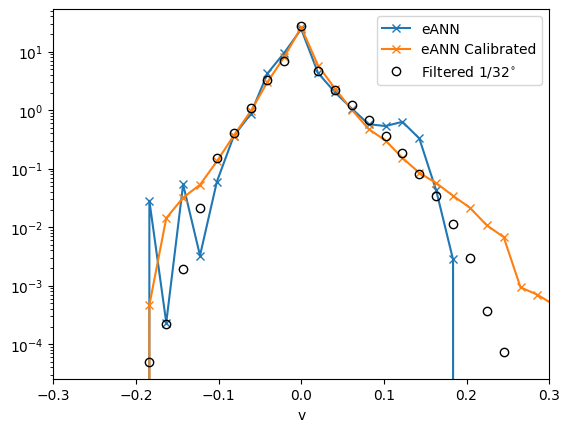

In [216]:
ds['eANN-64-N8-forcing-fluxes-R2'].pdf_v.plot(label='eANN', ls='-', marker='x')
ds['20-years-R2_FGR3_series-iteration-04-R2-ens-member-89'].pdf_v.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R32_R2_FGR3'].pdf_v.plot(color='k', label='Filtered $1/32^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()
plt.xlim([-0.3,0.3])

# Generalization to 1/4 resolution

In [226]:
ds.remesh('R64', 'R4')

Experiment R64 coarsegrained to R4 is created. Its identificator=R64_R4


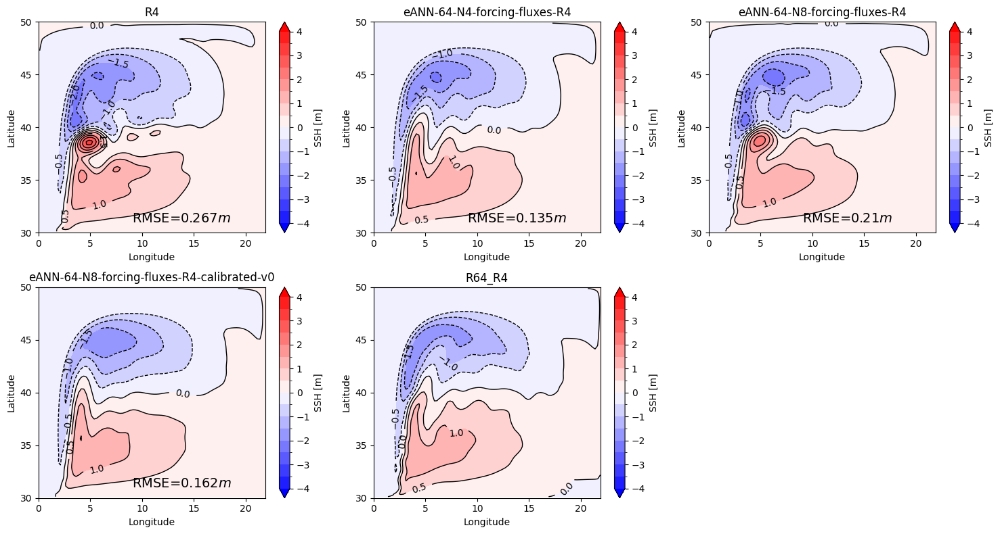

In [252]:
ds.plot_ssh(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'])

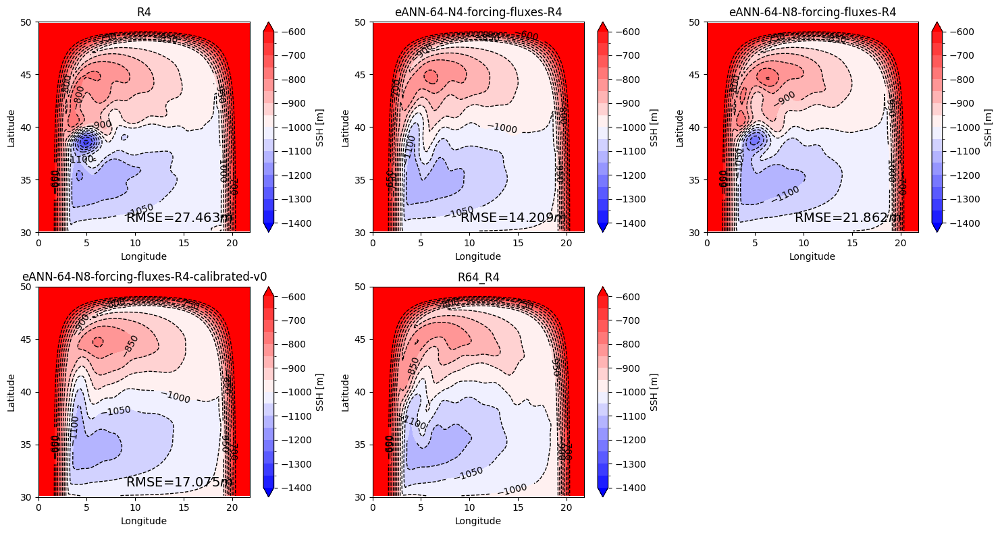

In [253]:
ds.plot_ssh(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'], zi=1)

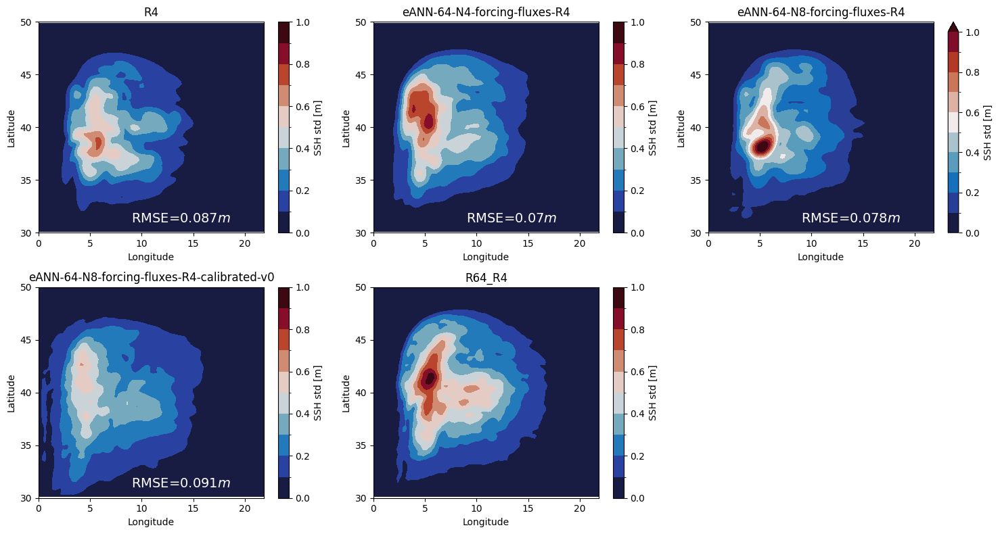

In [254]:
ds.plot_ssh_std(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'])

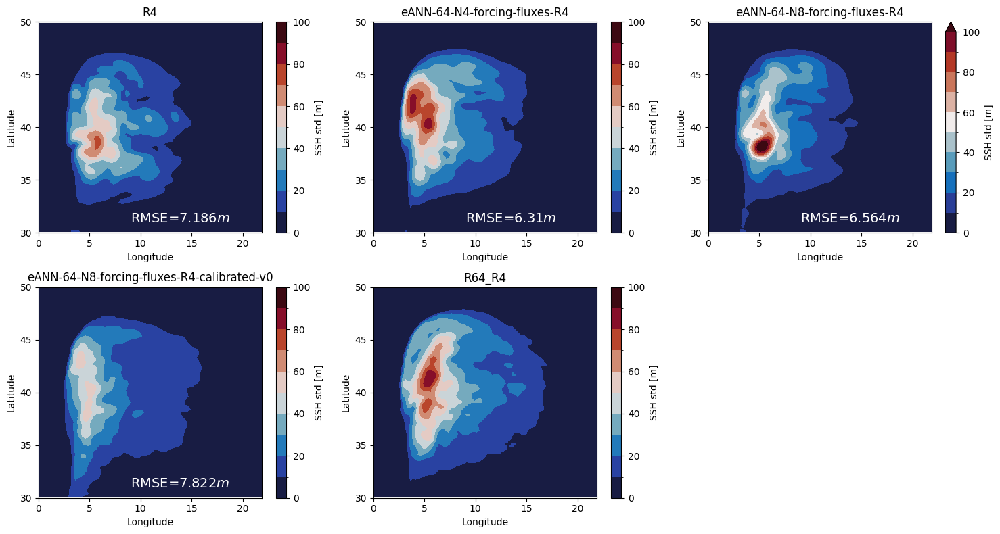

In [255]:
ds.plot_ssh_std(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'], zi=1)

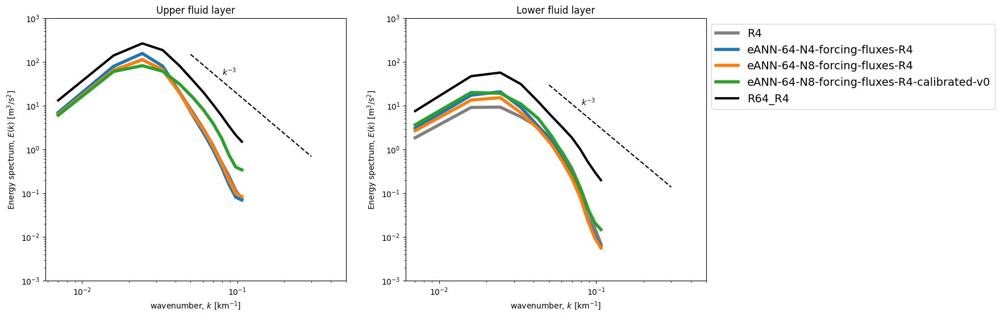

In [256]:
ds.plot_KE_spectrum(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4']);

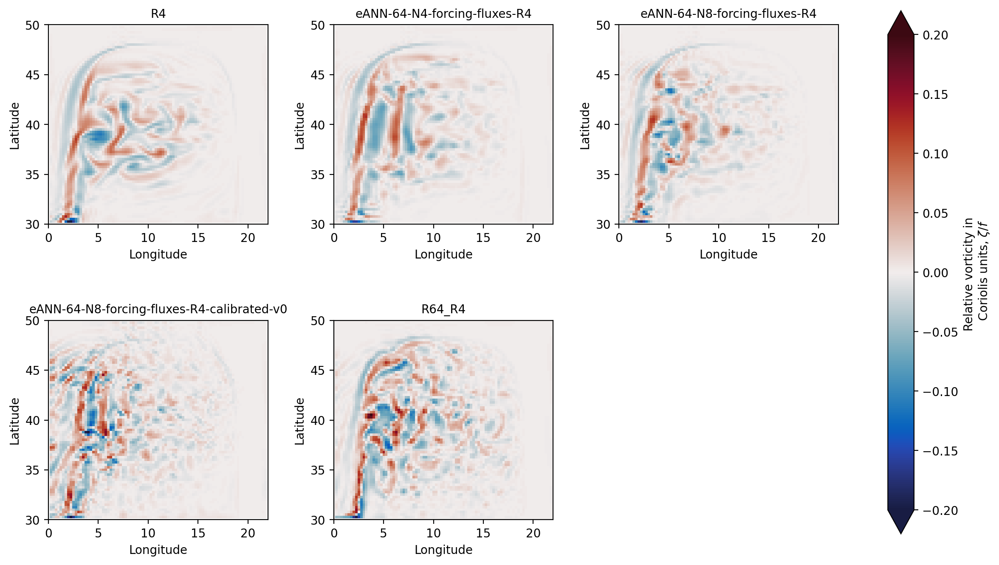

In [257]:
ds.plot_RV(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'], idx=-50);

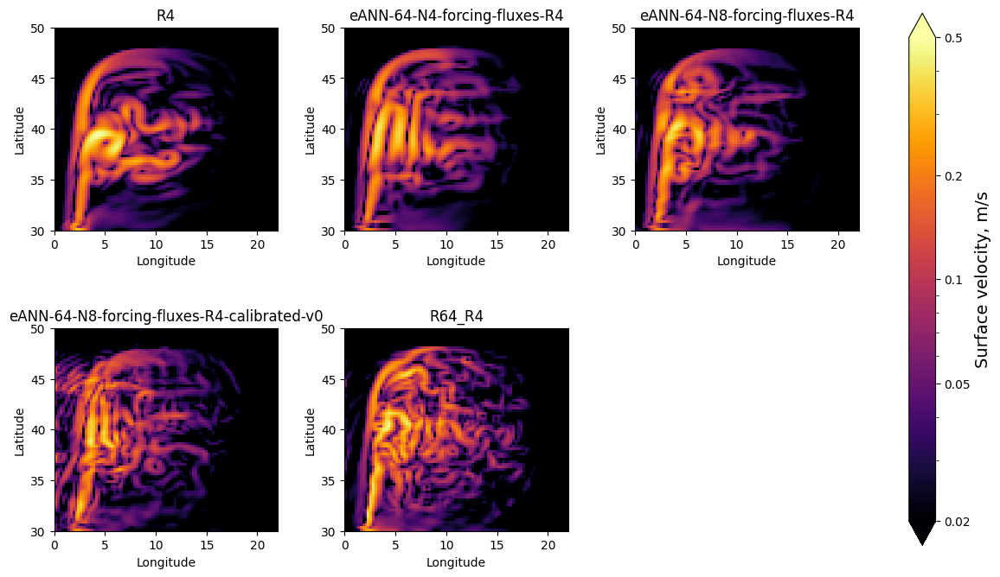

In [258]:
ds.plot_velocity_snapshot(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'], idx=-50);

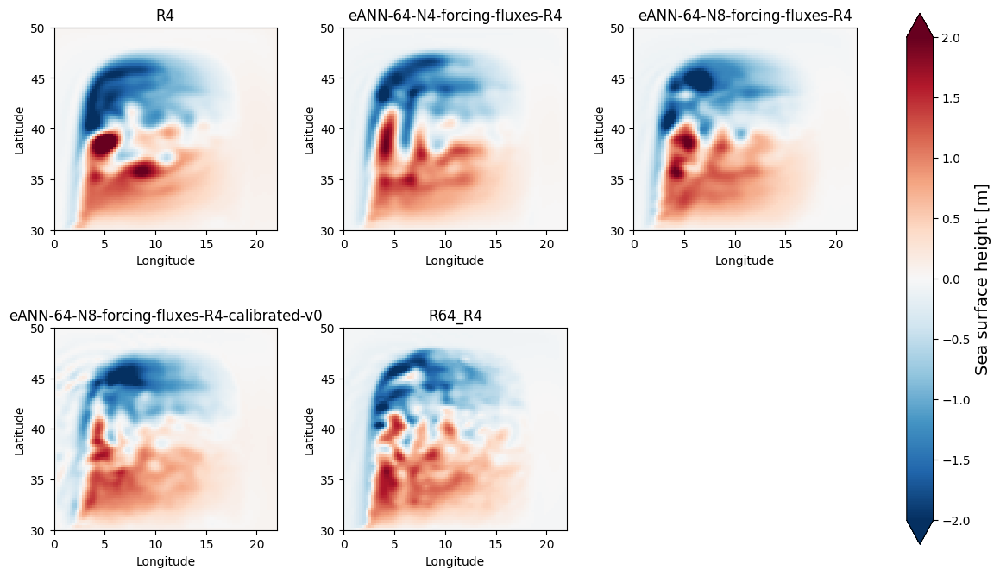

In [259]:
ds.plot_ssh_snapshot(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4'], idx=-50);

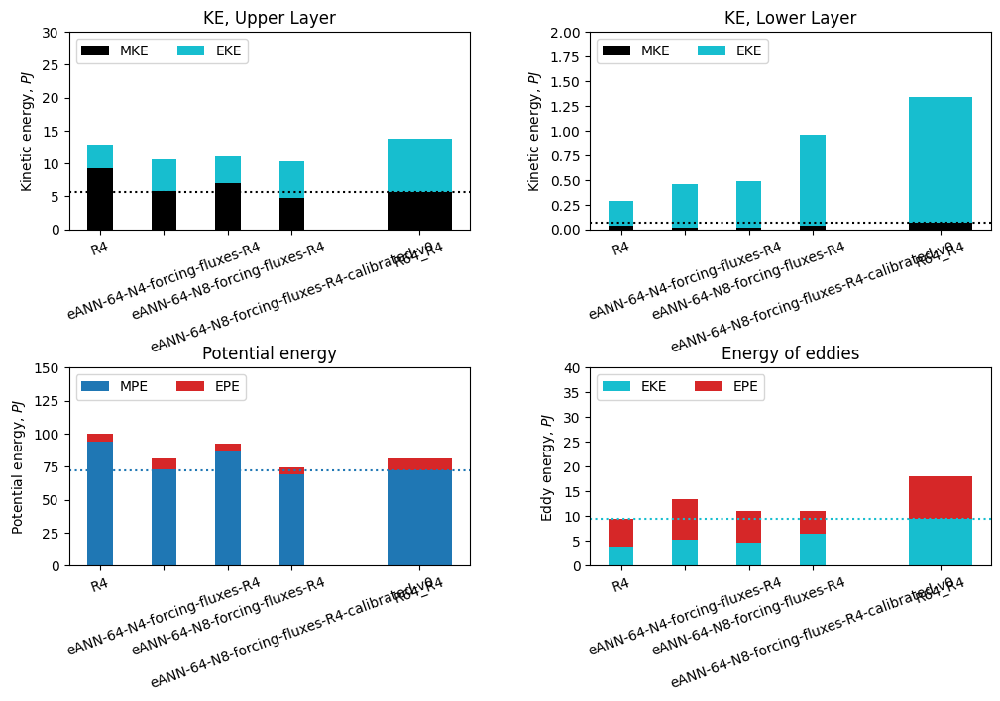

In [260]:
ds.plot_KE_PE(['R4', 'eANN-64-N4-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0', 'R64_R4']);

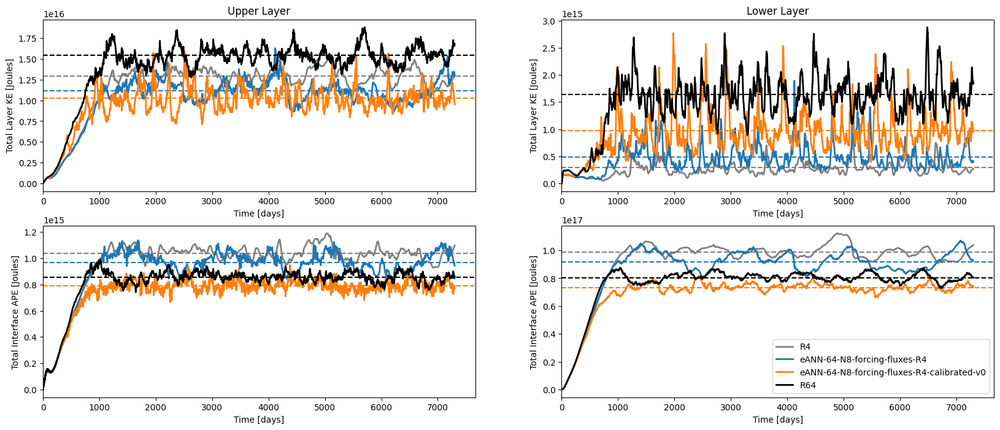

In [50]:
ds.plot_series(['R4', 'eANN-64-N8-forcing-fluxes-R4', 'eANN-64-N8-forcing-fluxes-R4-calibrated-v0',  'R64']);

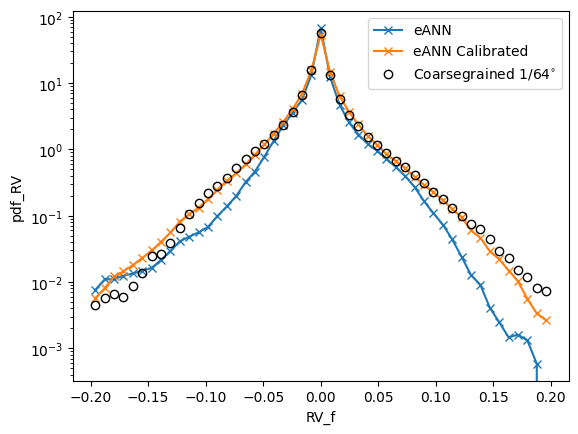

In [242]:
ds['eANN-64-N8-forcing-fluxes-R4'].pdf_RV.plot(label='eANN', ls='-', marker='x')
ds['eANN-64-N8-forcing-fluxes-R4-calibrated-v0'].pdf_RV.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R64_R4'].pdf_RV.plot(color='k', label='Coarsegrained $1/64^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()

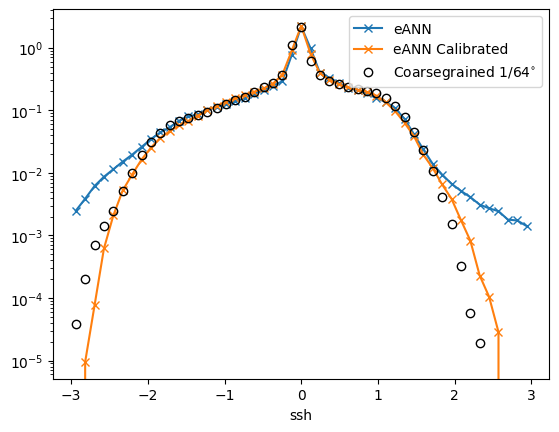

In [246]:
ds['eANN-64-N8-forcing-fluxes-R4'].pdf_ssh.plot(label='eANN', ls='-', marker='x')
ds['eANN-64-N8-forcing-fluxes-R4-calibrated-v0'].pdf_ssh.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R64_R4'].pdf_ssh.plot(color='k', label='Coarsegrained $1/64^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()

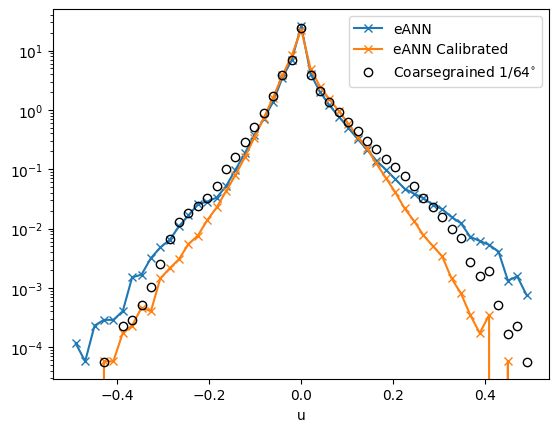

In [247]:
ds['eANN-64-N8-forcing-fluxes-R4'].pdf_u.plot(label='eANN', ls='-', marker='x')
ds['eANN-64-N8-forcing-fluxes-R4-calibrated-v0'].pdf_u.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R64_R4'].pdf_u.plot(color='k', label='Coarsegrained $1/64^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()

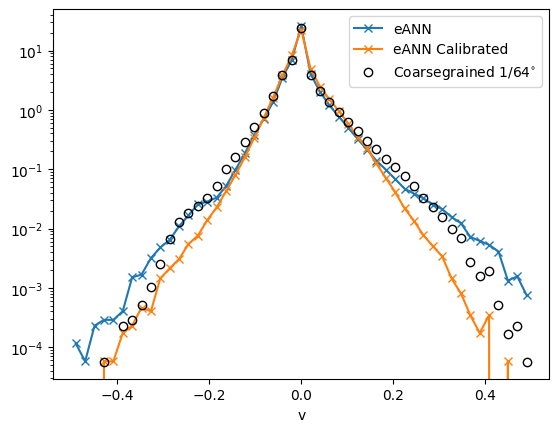

In [248]:
ds['eANN-64-N8-forcing-fluxes-R4'].pdf_v.plot(label='eANN', ls='-', marker='x')
ds['eANN-64-N8-forcing-fluxes-R4-calibrated-v0'].pdf_v.plot(label='eANN Calibrated', ls='-', marker='x')
ds['R64_R4'].pdf_v.plot(color='k', label='Coarsegrained $1/64^{\circ}$', ls='', marker='o', markerfacecolor='none')
plt.semilogy()
plt.legend()

# Visualize optimization process

In [3]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3/metrics.nc').isel(res=0)
observation = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_series_loss.nc')

In [99]:
import cmocean
def plot(idx=0):
    plt.figure(figsize=(16,4))
    plt.subplot(1,3,2)
    field = metrics.e_mean.isel(zi=0).mean('ens').isel(iter=idx) - observation.e_mean.isel(zi=0)
    field.plot.contourf(levels=np.arange(-2,2.2,0.2), cmap=cmocean.cm.balance)
    field.plot.contour(levels=np.arange(-2,2.2,0.2), colors='k')
    plt.title('Coarse model - Observation')
    RMSE = float(np.mean(field**2)**0.5)
    #mean_bias = float(field.mean())
    #plt.text(10,32,'mean='+str(round(mean_bias,5))+'m', fontsize=14)
    
    plt.subplot(1,3,1)
    field = metrics.e_mean.isel(zi=0).mean('ens').isel(iter=idx)
    field.plot.contourf(levels=np.arange(-4,4.5,0.5), cmap='bwr')
    field.plot.contour(levels=np.arange(-4,4.5,0.5), colors='k')
    plt.title('Coarse model \nwith calibrated parameterization')
    plt.text(20,2,'RMSE='+str(round(RMSE,3))+'m', fontsize=14)
    plt.subplot(1,3,3)
    field = observation.e_mean.isel(zi=0)
    field.plot.contourf(levels=np.arange(-4,4.5,0.5), cmap='bwr')
    field.plot.contour(levels=np.arange(-4,4.5,0.5), colors='k')
    plt.title('Observation')

    plt.suptitle(f'Iteration = {idx}', y=1.05, fontsize=20)

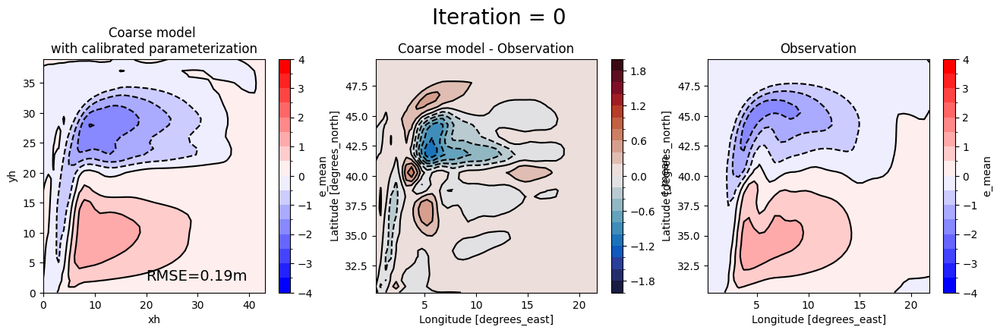

In [101]:
plot(0)

In [ ]:
create_animation_ffmpeg(plot, idx=range(10), filename='ssh_mean_comparison.mp4', FPS=1)

Frames already exists in folder .ffmpeg/ssh_mean_comparison


Savefig .ffmpeg/ssh_mean_comparison/frame-0.png
Savefig .ffmpeg/ssh_mean_comparison/frame-1.png


# New noise model
Also important to remove outliers

In [252]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series/metrics.nc').isel(res=0).isel(iter=0).drop_vars('WMSE_MAP')
observation = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_series_loss.nc')

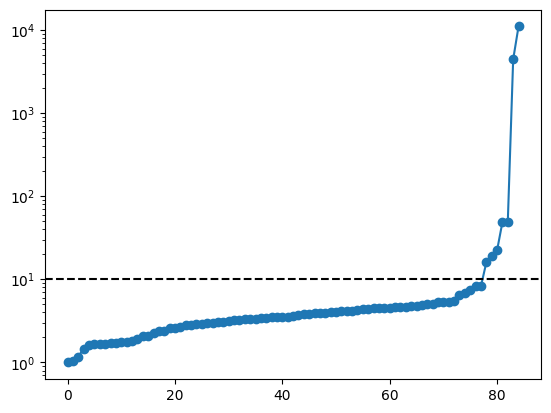

In [253]:
plt.plot(np.sort(metrics.WMSE.values / float(metrics.WMSE.min())), marker='o')
plt.yscale('log')
plt.axhline(y=10, color='k', ls='--')

In [254]:
print(np.argsort(metrics.WMSE.fillna(-1)))
metrics[{'ens':5}] = np.nan
metrics[{'ens':12}] = np.nan
metrics[{'ens':56}] = np.nan
metrics[{'ens':35}] = np.nan
metrics[{'ens':0}] = np.nan
metrics[{'ens':27}] = np.nan
metrics[{'ens':10}] = np.nan
metrics[{'ens':89}] = np.nan
metrics[{'ens':7}] = np.nan
metrics[{'ens':59}] = np.nan
metrics[{'ens':42}] = np.nan
metrics[{'ens':61}] = np.nan

<xarray.DataArray 'WMSE' (ens: 100)> Size: 800B
array([98, 85, 22, 25, 28, 71, 70, 68, 34, 41, 30, 53,  4, 47, 57, 54, 80,
       96,  6, 36, 63, 37, 14, 99, 72, 66, 13, 64,  8, 84, 18, 93, 45, 50,
       11, 95, 90, 75, 23, 44, 76, 40, 73, 49, 21,  3, 31, 48, 24, 78, 83,
       33, 67, 20, 77, 39, 62, 81, 94, 91, 92, 43, 38, 51, 15, 58, 97, 69,
       17, 86, 60,  9, 65, 79, 16, 46, 87, 29, 26, 74,  2, 82, 32, 55, 52,
        1, 19, 88, 61, 42, 59,  7, 89, 10, 27,  0, 35, 56, 12,  5])
Dimensions without coordinates: ens


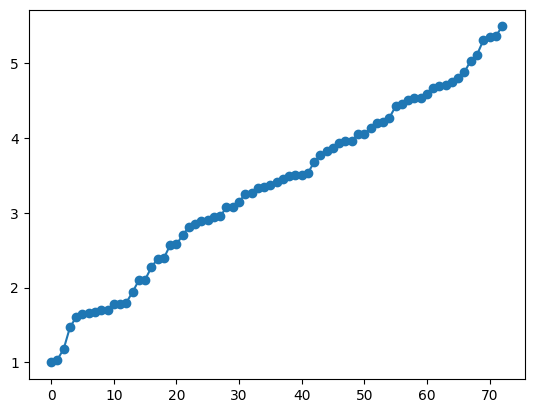

In [255]:
plt.plot(np.sort(metrics.WMSE.values / float(metrics.WMSE.min())), marker='o')

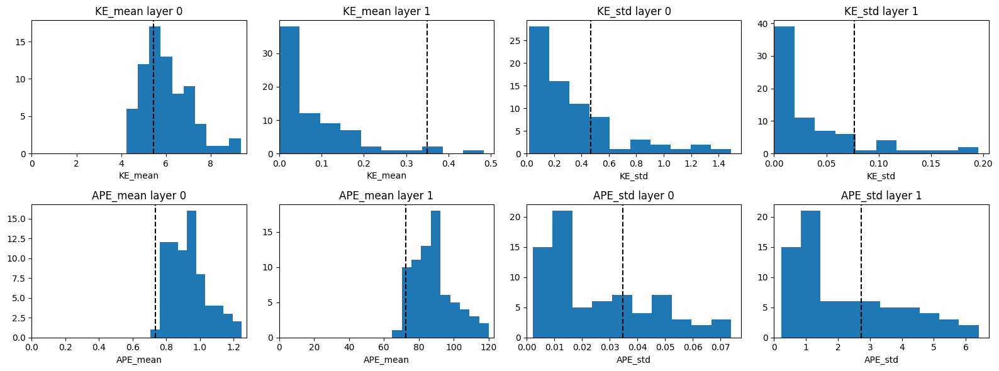

In [256]:
plt.figure(figsize=(16,6))
idx = 0
for metric in ['KE_mean', 'KE_std', 'APE_mean', 'APE_std']:
    for zl in [0,1]:
        idx += 1
        plt.subplot(2,4,idx)
        field = metrics[metric]
        target = observation[metric]
        if 'zl' in field.dims:
            field = field.isel(zl=zl)
            target = target.isel(zl=zl)
        else:
            field = field.isel(zi=zl)
            target = target.isel(zi=zl)

        field.plot.hist(bins=10);
        plt.axvline(x=target, color='k', ls='--')

        plt.title(f'{metric} layer {zl}')
        plt.xlim([0,None])

plt.tight_layout()

In [257]:
# Compute new normalization constants
metrics[['KE_mean', 'KE_std', 'APE_mean', 'APE_std']].var('ens')

<xarray.Dataset> Size: 64B
Dimensions:   (zl: 2, zi: 2)
Coordinates:
  * zi        (zi) float64 16B 1.034e+03 1.036e+03
  * zl        (zl) float64 16B 1.035e+03 1.036e+03
Data variables:
    KE_mean   (zl) float32 8B 1.171 0.009136
    KE_std    (zl) float32 8B 0.1053 0.00203
    APE_mean  (zi) float32 8B 0.01425 137.1
    APE_std   (zi) float32 8B 0.0003727 2.649

# Defining new loss weights
Here, we derive the weights from the initial ensemble without outliers. Same as for previous manually crafted loss, we sum degrees of freedom for 2d fields

In [258]:
for variable in ['KE_mean', 'KE_std', 'APE_mean', 'APE_std']:
    observation[f'{variable}_var_scale'] = metrics[variable].var('ens')

In [259]:
observation['e_mean_var_scale'] = metrics.e_mean.var('ens').sum(['xh', 'yh']) + 0 * observation['e_mean']
observation['e_std_var_scale'] = metrics.e_std.var('ens').sum(['xh', 'yh']) + 0 * observation['e_std']

In [260]:
observation.astype('float32').to_netcdf('../scripts/R32/R2_FGR3_series_scale.nc')

In [263]:
np.where([True, False, True])[0]

array([0, 2])

# Big jump at the first step

In [2]:
def plot_ensemble_parameters(metrics, iter=0):        
    ndim = len(metrics.pdim)
    plt.figure(figsize=(16,6))
    for pdim in range(ndim):
        plt.subplot(3,5,pdim+1)
        metrics.param.isel(pdim=pdim).isel(iter=0).plot.hist(bins=10, label='initial ensemble', color='k');
        metrics.param.isel(pdim=pdim).isel(iter=iter).plot.hist(bins=10);
        plt.xlim([metrics.param.isel(pdim=pdim).min(), metrics.param.isel(pdim=pdim).max()])
        plt.ylim([0,30])

In [118]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3/metrics.nc')
(metrics.param.isel(iter=1).mean('ens') - metrics.param.isel(iter=0).mean('ens')) / metrics.param.isel(iter=0).std('ens')

<xarray.DataArray 'param' (pdim: 13)> Size: 52B
array([-0.12262524, -0.07158125,  1.4870132 , -0.93161243,  0.43091297,
       -0.14785679, -1.258653  ,  1.9088953 , -3.3228953 ,  0.387623  ,
       -1.6440661 ,  0.8804898 , -2.8093395 ], dtype=float32)
Dimensions without coordinates: pdim

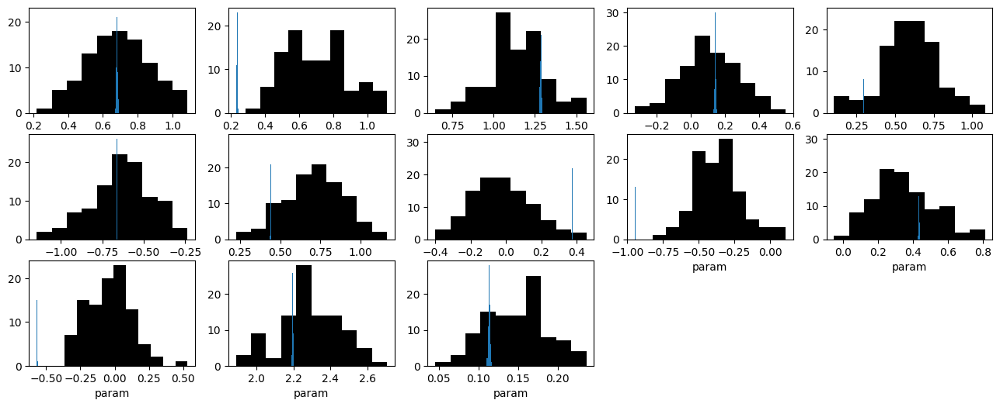

In [ ]:
plot_ensemble_parameters(metrics, iter=11)

In [116]:
create_animation_ffmpeg(lambda idx: plot_ensemble_parameters(metrics, iter=idx), FPS=1, filename='ensemble_R2_FGR3.mp4', idx=range(12))

Savefig .ffmpeg/ensemble_R2_FGR3/frame-0.png
Savefig .ffmpeg/ensemble_R2_FGR3/frame-1.png58
Savefig .ffmpeg/ensemble_R2_FGR3/frame-2.png13
Savefig .ffmpeg/ensemble_R2_FGR3/frame-3.png18
Savefig .ffmpeg/ensemble_R2_FGR3/frame-4.png69
Savefig .ffmpeg/ensemble_R2_FGR3/frame-5.png28
Savefig .ffmpeg/ensemble_R2_FGR3/frame-6.png6
Savefig .ffmpeg/ensemble_R2_FGR3/frame-7.png7
Savefig .ffmpeg/ensemble_R2_FGR3/frame-8.png9
Savefig .ffmpeg/ensemble_R2_FGR3/frame-9.png1
Savefig .ffmpeg/ensemble_R2_FGR3/frame-10.png
Savefig .ffmpeg/ensemble_R2_FGR3/frame-11.png65
Native resolution of snapshots is used: 2574x1050

Animation ensemble_R2_FGR3.mp4 at FPS=1 will last for 12.0 seconds. The frames are saved to 
.ffmpeg/ensemble_R2_FGR3

Running the command:
cd /home/pp2681/calibration/notebooks; ffmpeg -y -framerate 1 -i .ffmpeg/ensemble_R2_FGR3/frame-%d.png -s:v 2574x1050 -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p ensemble_R2_FGR3.mp4


ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-l

In [22]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series/metrics.nc')
np.linalg.norm((metrics.param.isel(iter=5).mean('ens') - metrics.param.isel(iter=0).mean('ens')) / (metrics.param.isel(iter=0).std('ens')))

8.65687

In [52]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_scale/metrics.nc')
np.linalg.norm((metrics.param.isel(iter=6).mean('ens') - metrics.param.isel(iter=0).mean('ens')) / (metrics.param.isel(iter=0).std('ens')))

1.1829602

# Calibration at 1/4 resolution

In [4]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R4_FGR3/metrics.nc')
np.linalg.norm((metrics.param.isel(iter=-1).mean('ens') - metrics.param.isel(iter=0).mean('ens')) / (metrics.param.isel(iter=0).std('ens')))

6.112149

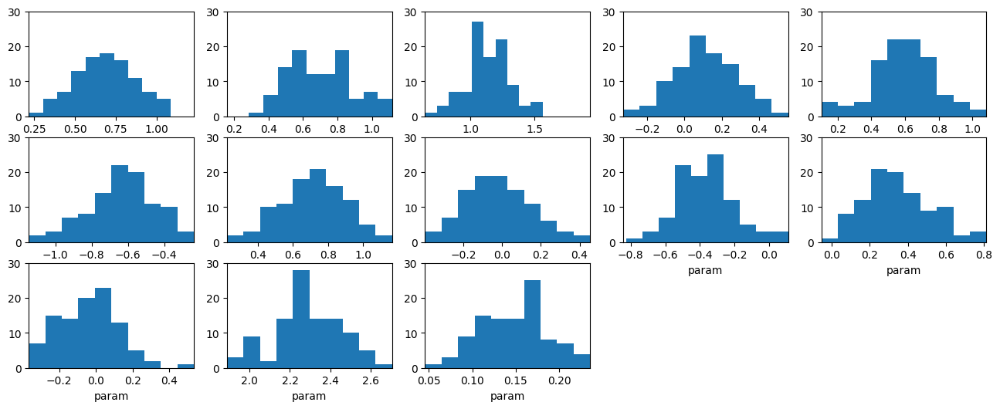

In [15]:
plot_ensemble_parameters(metrics, iter=0)

In [16]:
create_animation_ffmpeg(lambda idx: plot_ensemble_parameters(metrics, iter=idx), FPS=1, filename='ensemble_R4_FGR3.mp4', idx=range(10))

Savefig .ffmpeg/ensemble_R4_FGR3/frame-0.png
Savefig .ffmpeg/ensemble_R4_FGR3/frame-1.png86
Savefig .ffmpeg/ensemble_R4_FGR3/frame-2.png5
Savefig .ffmpeg/ensemble_R4_FGR3/frame-3.png57
Savefig .ffmpeg/ensemble_R4_FGR3/frame-4.png
Savefig .ffmpeg/ensemble_R4_FGR3/frame-5.png16
Savefig .ffmpeg/ensemble_R4_FGR3/frame-6.png8
Savefig .ffmpeg/ensemble_R4_FGR3/frame-7.png7
Savefig .ffmpeg/ensemble_R4_FGR3/frame-8.png76
Savefig .ffmpeg/ensemble_R4_FGR3/frame-9.png28
Native resolution of snapshots is used: 2590x1060

Animation ensemble_R4_FGR3.mp4 at FPS=1 will last for 10.0 seconds. The frames are saved to 
.ffmpeg/ensemble_R4_FGR3

Running the command:
cd /home/pp2681/calibration/notebooks; ffmpeg -y -framerate 1 -i .ffmpeg/ensemble_R4_FGR3/frame-%d.png -s:v 2590x1060 -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p ensemble_R4_FGR3.mp4


ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-l

(0.0, 50.0)

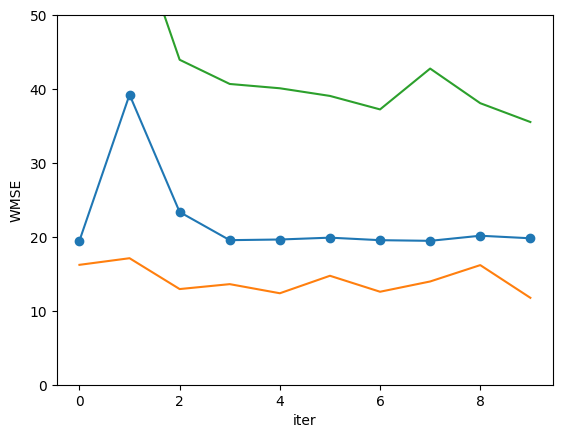

In [20]:
metrics.WMSE_MAP.plot(marker='o')
metrics.WMSE.min('ens').plot()
metrics.WMSE.max('ens').plot()
plt.ylim([0,50])

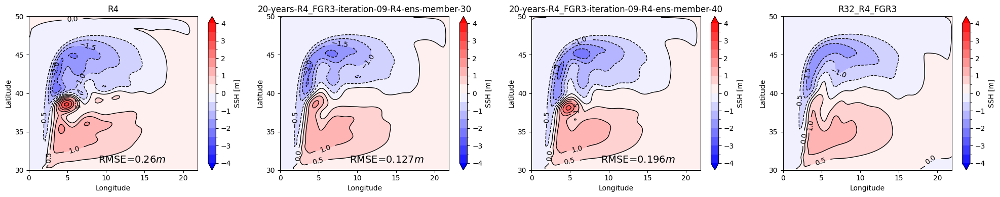

In [82]:
ds.plot_ssh(['R4', '20-years-R4_FGR3-iteration-09-R4-ens-member-30', '20-years-R4_FGR3-iteration-09-R4-ens-member-40', 'R32_R4_FGR3'], zi=0, ncols=4)

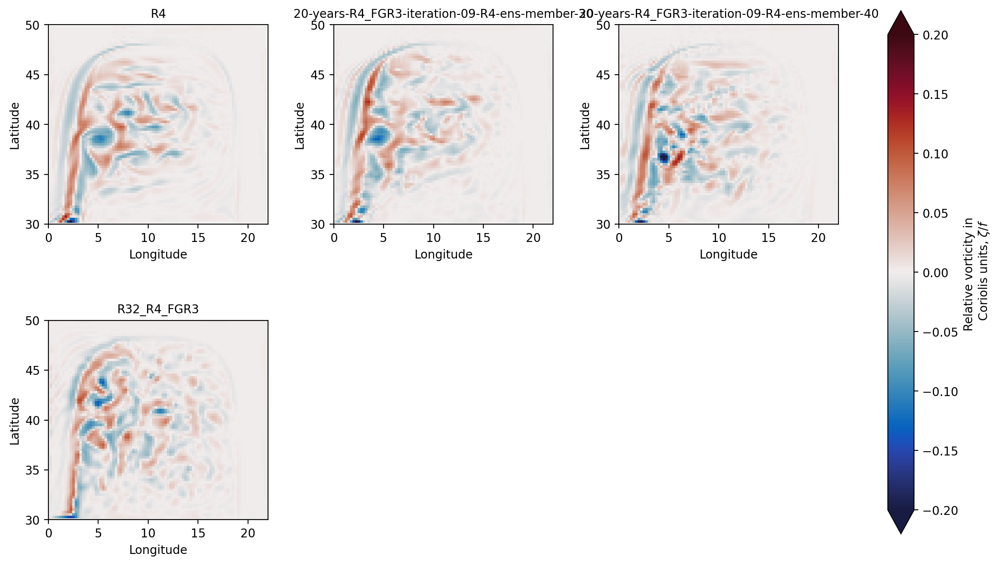

In [83]:
ds.plot_RV(['R4', '20-years-R4_FGR3-iteration-09-R4-ens-member-30', '20-years-R4_FGR3-iteration-09-R4-ens-member-40', 'R32_R4_FGR3'])

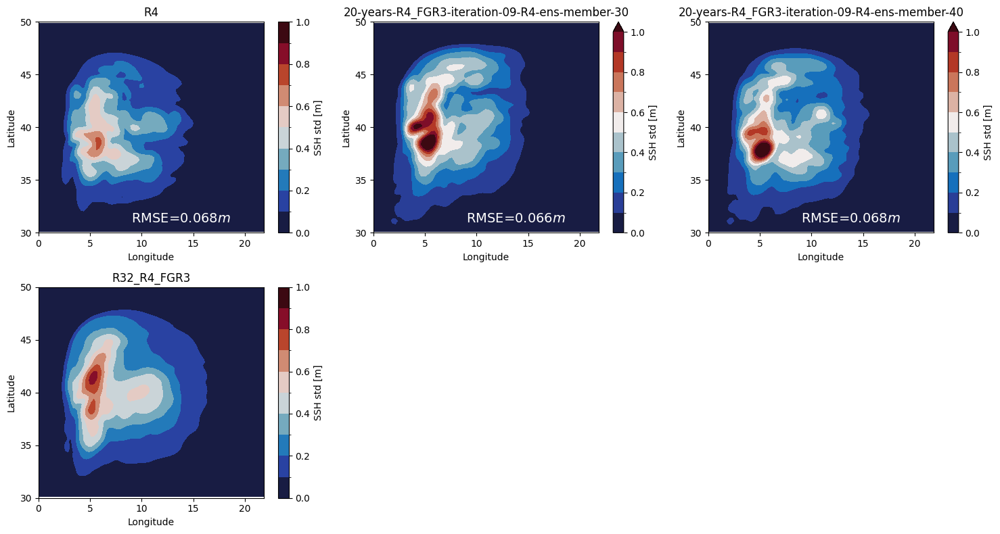

In [84]:
ds.plot_ssh_std(['R4', '20-years-R4_FGR3-iteration-09-R4-ens-member-30', '20-years-R4_FGR3-iteration-09-R4-ens-member-40', 'R32_R4_FGR3'], zi=0)

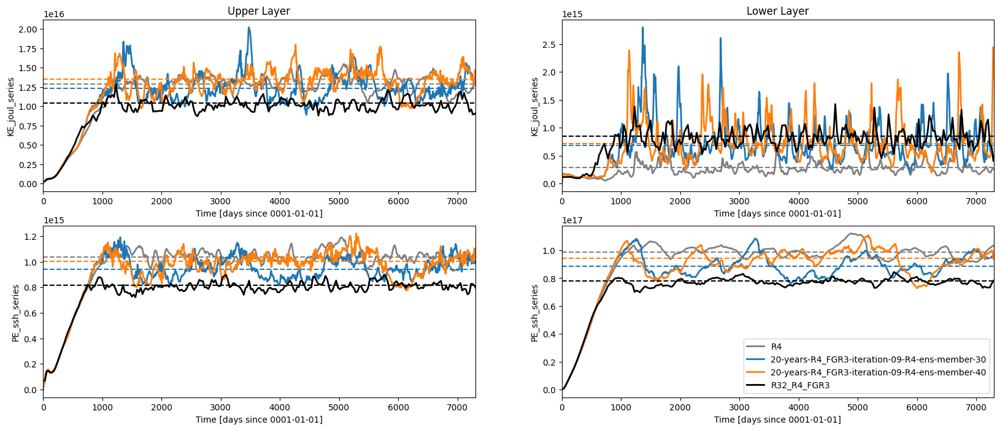

In [85]:
ds.plot_series(['R4', '20-years-R4_FGR3-iteration-09-R4-ens-member-30', '20-years-R4_FGR3-iteration-09-R4-ens-member-40', 'R32_R4_FGR3'], tmax=7300)

# Correlation time for NW2

In [2]:
apr28 = xr.open_dataset('/scratch/pp2681/mom6/regression_tests/profiling-NW2-R4/output-MOM6-dev-m2lines-Apr28/snapshots_00030001.nc', decode_times=False)

In [3]:
jun18 = xr.open_dataset('/scratch/pp2681/mom6/regression_tests/profiling-NW2-R4/output-MOM6-dev-m2lines-Jun18/snapshots_00030001.nc', decode_times=False)

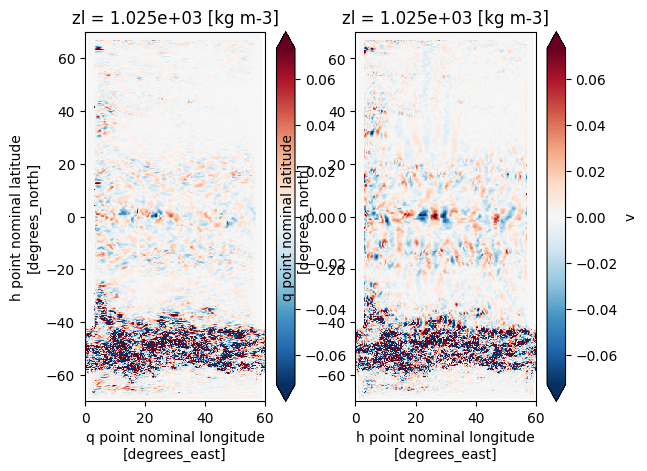

In [6]:
plt.subplot(1,2,1)
(apr28.u[0][5] - apr28.u[1][5]).plot(robust=True)

plt.subplot(1,2,2)
(apr28.v[0][5] - apr28.v[1][5]).plot(robust=True)

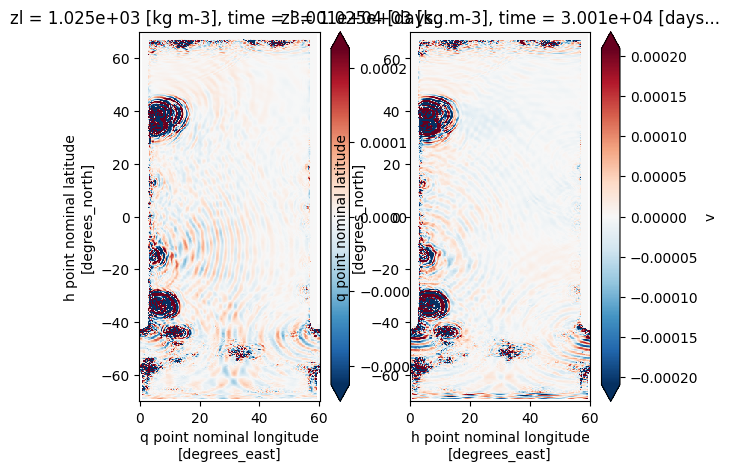

In [29]:
plt.subplot(1,2,1)
(jun18.u[-1][5] - apr28.u[-1][5]).plot(robust=True)

plt.subplot(1,2,2)
(jun18.v[-1][5] - apr28.v[-1][5]).plot(robust=True)

# Prior for eANN parameters

In [122]:
# Here parameters are weights2, biases2
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/1_day_response/last_layer_eANN/metrics.nc').isel(res=0,iter=0).isel(Time=0)

In [123]:
Nens = len(metrics.ens)

In [124]:
Nens

1000

In [125]:
# We also download the scalar product
static = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_PJ.nc')

In [126]:
# First we create observational metric
y = np.concatenate([metrics.u.values.reshape(1000,-1), metrics.v.values.reshape(Nens,-1)], 1)

In [127]:
y.shape

(1000, 7208)

In [128]:
# Second, we create diagonal of obs variance matrix
Gamma = np.concatenate([static.u_PJvar.values.reshape(-1), static.v_PJvar.values.reshape(-1)])

In [129]:
Gamma.shape

(7208,)

In [130]:
# First, we estimate the jacobian of the forward map w.r.t. u and v
# J = C_{yx} C_{xx}^{-1}
# Here x is the vector of parameters and y is the u,v vector in two layers all stacked

x_dash = (metrics.param - metrics.param.mean('ens')).values
y_dash = y - y.mean(0)

In [131]:
x_dash.shape

(1000, 13)

In [132]:
y_dash.shape

(1000, 7208)

In [133]:
C_xx = x_dash.T @ x_dash / Nens 

In [134]:
C_yx = y_dash.T @ x_dash / Nens

In [135]:
C_yx.shape

(7208, 13)

In [136]:
C_xx.shape

(13, 13)

In [137]:
J = C_yx @ np.linalg.inv(C_xx)

In [138]:
J.shape

(7208, 13)

In [139]:
sensitivity_matrix = (J.T / Gamma) @ J

([<matplotlib.axis.YTick at 0x7f47ff76f0d0>,
 [Text(0, 0, '0'),
  Text(0, 1, '1'),
  Text(0, 2, '2'),
  Text(0, 3, '3'),
  Text(0, 4, '4'),
  Text(0, 5, '5'),
  Text(0, 6, '6'),
  Text(0, 7, '7'),
  Text(0, 8, '8'),
  Text(0, 9, '9'),
  Text(0, 10, '10'),
  Text(0, 11, '11'),
  Text(0, 12, '12')])

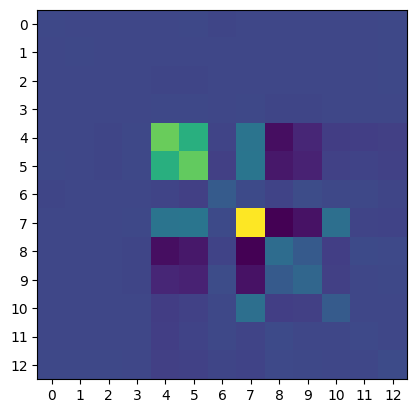

In [164]:
plt.imshow(sensitivity_matrix)
plt.xticks(np.arange(13))
plt.yticks(np.arange(13))

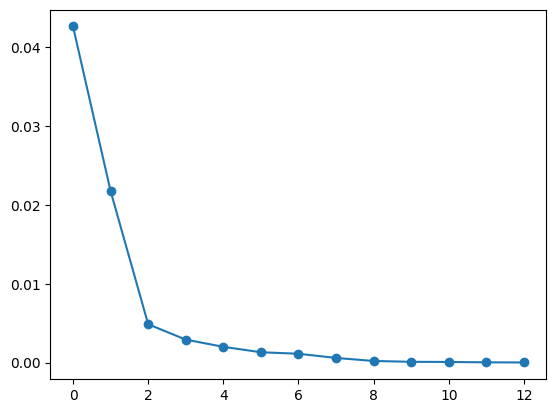

In [143]:
plt.plot(np.linalg.eig(sensitivity_matrix).eigenvalues, marker='o')

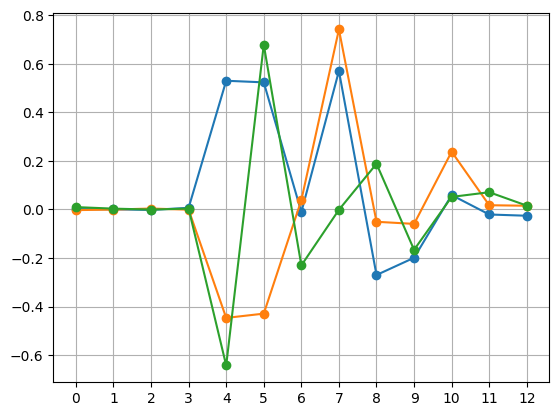

In [173]:
eigenvectors = np.linalg.eig(sensitivity_matrix).eigenvectors
plt.plot(eigenvectors[:,0], marker='o')
plt.plot(eigenvectors[:,1], marker='o')
plt.plot(eigenvectors[:,2], marker='o')
plt.xticks(np.arange(13))
plt.grid()
# Three most important parameters: 7,4,5

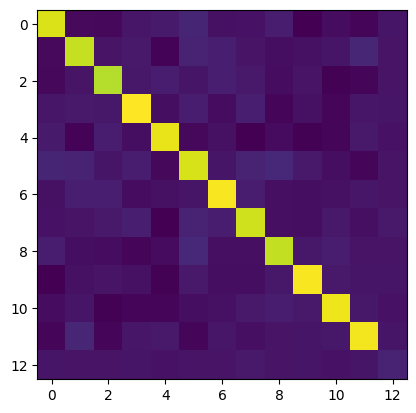

In [172]:
plt.imshow(C_xx)

In [175]:
np.diag(C_xx)

array([0.50578856, 0.48663092, 0.47261608, 0.535714  , 0.5169498 ,
       0.5022581 , 0.52907693, 0.4953126 , 0.48442346, 0.53062016,
       0.5204025 , 0.52579737, 0.02310934], dtype=float32)

In [176]:
# Hand-crafted prior which perturbes only 7, 4, and 5 parameters
C_xx_prior=np.zeros((13,13))
C_xx_prior[4,4] = 0.5
C_xx_prior[5,5] = 0.5
C_xx_prior[7,7] = 0.5

In [177]:
C_xx_prior

array([[0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.5, 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ]])

In [178]:
np.save("../scripts/priors/weights2_biases2_selected_params_457.npy", C_xx_prior)

In [77]:
# The prior covariance matrix is 
#(J^T Gamma^-1 J)^-1, that is it scales proportionally to observational error
C_xx_prior = np.linalg.inv((J.T / Gamma) @ J)

In [78]:
C_xx_prior.shape

(13, 13)

In [82]:
# We rescale prior such that it has the same trace
np.diag(C_xx).sum()

6.1287

In [83]:
np.diag(C_xx_prior).sum()

162905.45606550883

In [84]:
C_xx_prior = C_xx_prior * np.diag(C_xx).sum() / np.diag(C_xx_prior).sum()

In [86]:
np.diag(C_xx_prior)

array([0.55898061, 0.61615712, 1.19093909, 3.3012929 , 0.00664961,
       0.00559324, 0.01947674, 0.00423639, 0.02551374, 0.02031123,
       0.03198738, 0.17821812, 0.16934361])

In [87]:
np.diag(C_xx)

array([0.50578856, 0.48663092, 0.47261608, 0.535714  , 0.5169498 ,
       0.5022581 , 0.52907693, 0.4953126 , 0.48442346, 0.53062016,
       0.5204025 , 0.52579737, 0.02310934], dtype=float32)

In [91]:
np.sort(np.linalg.eig(C_xx).eigenvalues)[::-1]

array([0.5904797 , 0.5827182 , 0.56996816, 0.5471762 , 0.5396951 ,
       0.5202512 , 0.48441547, 0.4758083 , 0.471737  , 0.46180448,
       0.43942958, 0.42227164, 0.02294478], dtype=float32)

In [96]:
np.sort(np.linalg.eig(C_xx_prior).eigenvalues)[::-1]

array([3.60065625e+00, 1.27958131e+00, 4.92061593e-01, 4.02500973e-01,
       1.85093935e-01, 6.43099790e-02, 3.36602023e-02, 2.87452568e-02,
       1.88197735e-02, 1.29217863e-02, 7.73779132e-03, 1.72887634e-03,
       8.82056703e-04])

In [107]:
np.linalg.cond(C_xx_prior)

4082.114257894307

In [106]:
np.save("../scripts/priors/weights2_biases2_Cxx_prior.npy", C_xx_prior)

In [216]:
X = np.random.multivariate_normal(
    mean=np.zeros(13),
    cov=C_xx_prior,
    size=100
)
X.shape

(100, 13)

In [101]:
X[0]

array([ 0.46187255,  0.55133897,  0.69365187, -0.9424292 , -0.07630563,
       -0.03357333, -0.1691904 ,  0.09034729, -0.27793703,  0.08007765,
       -0.46340708,  0.35315072, -0.29036715])

In [102]:
X[1]

array([ 0.01739283,  0.29189877, -0.63873062, -2.20330727,  0.06196507,
        0.05090613, -0.01790432,  0.06790557,  0.19924887, -0.0478078 ,
        0.02251373,  0.16623684,  0.1790226 ])

In [103]:
X[2]

array([-0.38819901,  1.89076754,  0.73006039, -2.8178273 ,  0.11689499,
       -0.02903619, -0.30373082,  0.01299616,  0.13220687, -0.05631536,
       -0.02309709, -0.13222268, -0.50860999])

In [104]:
X[3]

array([-0.26334449,  0.26832853, -0.72753817, -0.96394771, -0.09188372,
        0.00628542, -0.0284603 ,  0.07248924,  0.10229166, -0.10456958,
       -0.16981722, -0.15348443, -0.38611335])

In [192]:
# We would like to shrink the condition number to approximately 100
np.linalg.cond(C_xx_prior)

4082.114257894307

In [209]:
C_xx_prior = np.linalg.inv((J.T / Gamma) @ J + 0.00042*np.eye(13))
C_xx_prior = C_xx_prior * np.diag(C_xx).sum() / np.diag(C_xx_prior).sum()

In [210]:
np.linalg.cond(C_xx_prior)

100.06236257733738

In [211]:
np.diag(C_xx_prior)

array([0.86259688, 0.89825534, 0.9914675 , 1.05312766, 0.06763472,
       0.05915842, 0.17865214, 0.04312829, 0.22466423, 0.18503891,
       0.2816423 , 0.71549403, 0.56783935])

In [212]:
np.set_printoptions(suppress=True)
np.sort(np.linalg.eig(C_xx_prior).eigenvalues)[::-1]

array([1.0697481 , 1.02463323, 0.92751647, 0.89678586, 0.73881739,
       0.45818142, 0.29945927, 0.26635633, 0.19035409, 0.13821928,
       0.08717733, 0.02076019, 0.01069081])

In [213]:
np.save("../scripts/priors/weights2_biases2_Cxx_prior_cond_100.npy", C_xx_prior)

In [230]:
C_xx_prior = np.linalg.inv((J.T / Gamma) @ J + 0.0047*np.eye(13))
C_xx_prior = C_xx_prior * np.diag(C_xx).sum() / np.diag(C_xx_prior).sum()

In [231]:
np.linalg.cond(C_xx_prior)

10.052479634968611

In [232]:
np.save("../scripts/priors/weights2_biases2_Cxx_prior_cond_10.npy", C_xx_prior)

# What is the condition number of C_xx for EKI first iteration?

In [271]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series/metrics.nc').isel(iter=1)

In [272]:
x_dash = (metrics.param - metrics.param.mean('ens')).values

In [273]:
C_xx_EKI = x_dash.T @ x_dash / 100

In [274]:
np.linalg.cond(C_xx_EKI)

36.506992

In [276]:
np.diag(C_xx_EKI)

array([0.0279747 , 0.02831725, 0.02585333, 0.02314364, 0.01722987,
       0.01978461, 0.02061678, 0.01267993, 0.02282356, 0.02029688,
       0.02206392, 0.02511544, 0.00144063], dtype=float32)

# Prior for full eANN

In [35]:
# Here parameters are weights1, biases1, weights2, biases2
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/1_day_response/all_layers_eANN/metrics.nc').isel(res=0,iter=0).isel(Time=0)
# We also download the scalar product
static = xr.open_dataset('/home/pp2681/calibration/scripts/R32/R2_FGR3_PJ.nc')

In [36]:
mask_nan = np.isnan(metrics.RMSE_u.isel(zl=0))

In [46]:
u, v, param = metrics.u[~mask_nan], metrics.v[~mask_nan], metrics.param[~mask_nan]
Nens = u.shape[0]
param.shape

(1796, 89)

In [41]:
u.values.shape

(1796, 2, 40, 45)

In [42]:
# First we create observational metric
y = np.concatenate([u.values.reshape(Nens,-1), v.values.reshape(Nens,-1)], 1)

In [43]:
y.shape

(1796, 7208)

In [44]:
# Second, we create diagonal of obs variance matrix
Gamma = np.concatenate([static.u_PJvar.values.reshape(-1), static.v_PJvar.values.reshape(-1)])

In [45]:
Gamma.shape

(7208,)

In [50]:
# First, we estimate the jacobian of the forward map w.r.t. u and v
# J = C_{yx} C_{xx}^{-1}
# Here x is the vector of parameters and y is the u,v vector in two layers all stacked

x_dash = (param - param.mean('ens')).values
y_dash = y - y.mean(0)

In [51]:
x_dash.shape

(1796, 89)

In [52]:
y_dash.shape

(1796, 7208)

In [53]:
C_xx = x_dash.T @ x_dash / Nens 

In [54]:
C_yx = y_dash.T @ x_dash / Nens

In [55]:
C_yx.shape

(7208, 89)

In [56]:
C_xx.shape

(89, 89)

In [57]:
J = C_yx @ np.linalg.inv(C_xx)

In [58]:
J.shape

(7208, 89)

In [59]:
# The prior covariance matrix is 
#(J^T Gamma^-1 J)^-1, that is it scales proportionally to observational error
C_xx_prior = np.linalg.inv((J.T / Gamma) @ J)

In [60]:
np.linalg.cond(C_xx_prior)

97684.34129332025

In [64]:
np.sort(np.linalg.eig(C_xx_prior).eigenvalues)[::-1]

array([3.69223490e+05, 3.28702849e+05, 3.10179446e+05, 2.56600855e+05,
       2.44517889e+05, 2.27100154e+05, 2.19304552e+05, 2.03941945e+05,
       1.80374834e+05, 1.76068983e+05, 1.69593824e+05, 1.59908200e+05,
       1.50347072e+05, 1.45503502e+05, 1.33794406e+05, 1.26073557e+05,
       1.23249059e+05, 1.08925496e+05, 1.00909526e+05, 9.86465344e+04,
       9.61937943e+04, 9.02315653e+04, 8.65760558e+04, 8.51824721e+04,
       8.11505486e+04, 7.06213283e+04, 7.03000964e+04, 6.79211261e+04,
       6.34456040e+04, 6.01046582e+04, 5.77050064e+04, 5.62882144e+04,
       5.07186506e+04, 4.84439986e+04, 4.43347589e+04, 4.32213059e+04,
       4.12731550e+04, 3.91883367e+04, 3.40419687e+04, 3.30435557e+04,
       3.03830128e+04, 2.91563263e+04, 2.69953102e+04, 2.27352016e+04,
       2.26772359e+04, 2.17480304e+04, 2.14728022e+04, 1.94872098e+04,
       1.81047904e+04, 1.55057659e+04, 1.48947854e+04, 1.44236487e+04,
       1.24733227e+04, 1.17222981e+04, 1.09172520e+04, 9.86411937e+03,
      

In [78]:
# Fix condition number to 100
C_xx_prior = np.linalg.inv((J.T / Gamma) @ J + 0.00265*np.eye(89))
# Normalize trace
C_xx_prior = C_xx_prior * np.diag(C_xx).sum() / np.diag(C_xx_prior).sum()
np.linalg.cond(C_xx_prior)

100.73364061956998

In [79]:
np.sort(np.linalg.eig(C_xx_prior).eigenvalues)[::-1]

array([9.17207644, 9.17092218, 9.1702942 , 9.16796815, 9.16730293,
       9.16621966, 9.16567917, 9.16449333, 9.16228238, 9.16181462,
       9.16106657, 9.15983482, 9.15846363, 9.15770042, 9.15562775,
       9.15405106, 9.15342506, 9.14975246, 9.14724382, 9.1464621 ,
       9.14557345, 9.14321267, 9.14160515, 9.14095616, 9.13895352,
       9.13265114, 9.13242934, 9.13072183, 9.12716453, 9.12416584,
       9.12179914, 9.12030769, 9.11364299, 9.11048375, 9.10396158,
       9.10198261, 9.0982656 , 9.09388237, 9.08078919, 9.07778204,
       9.06881548, 9.06413716, 9.0548755 , 9.03154517, 9.03116827,
       9.02485682, 9.02288434, 9.00703462, 8.99398873, 8.96331353,
       8.95458669, 8.9473653 , 8.91183857, 8.89510377, 8.87469383,
       8.84314998, 8.81014183, 8.79582529, 8.76645952, 8.67852793,
       8.66715361, 8.59998377, 8.55879841, 8.48117498, 8.41639131,
       8.40738314, 8.23214986, 8.17679244, 8.02019642, 7.7409845 ,
       7.66427859, 7.59905573, 7.33964957, 6.94710791, 6.54328

In [80]:
np.save("../scripts/priors/weights1_biases1_weights2_biases2_Cxx_prior_cond_100.npy", C_xx_prior)

In [81]:
# Sensitivity matrix
S = (J.T / Gamma) @ J

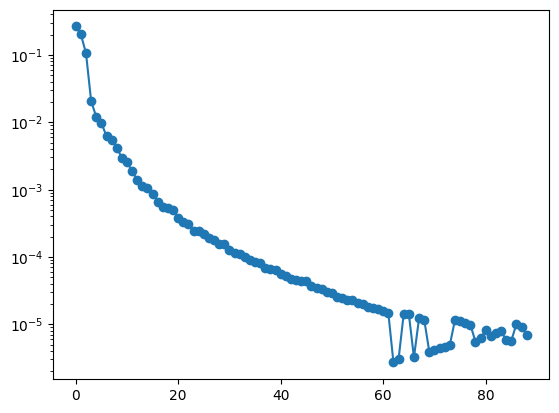

In [ ]:
plt.plot(np.linalg.eig(S).eigenvalues, marker='o')
plt.yscale('log')
plt.x

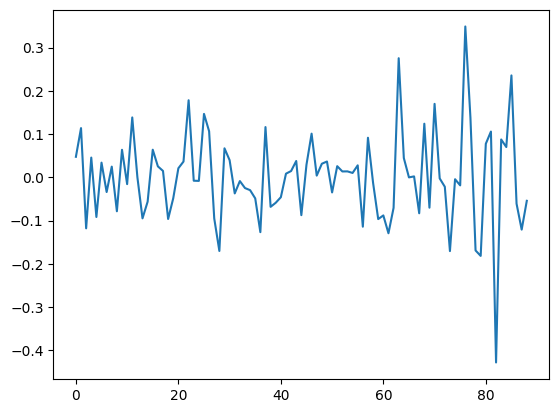

In [120]:
#plt.plot(np.linalg.eig(S).eigenvectors[:,0])
#plt.plot(np.linalg.eig(S).eigenvectors[:,1])
plt.plot(np.linalg.eig(S).eigenvectors[:,9])

# How many parameters actually matter for energetic metrics?

In [214]:
metrics = xr.open_mfdataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_200/metrics*.nc').isel(iter=0).load()
mask = metrics.KE_mean.isel(zl=0).notnull().values
metrics = metrics.isel(ens=mask)
Nens = len(metrics.ens)

In [215]:
metrics_dash = metrics.copy() - metrics.copy().mean('ens')


In [216]:
x = metrics_dash.param.values
C_xx = x.T @ x / Nens

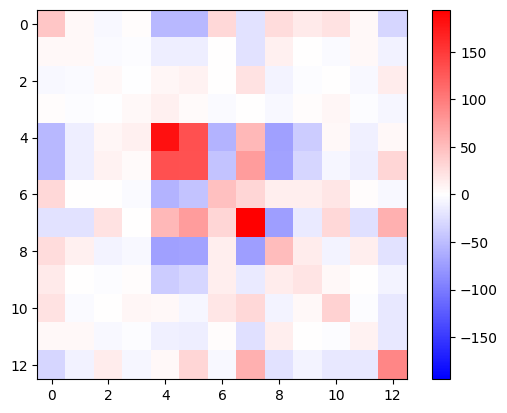

In [217]:
y = metrics_dash.e_mean.isel(zi=0).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

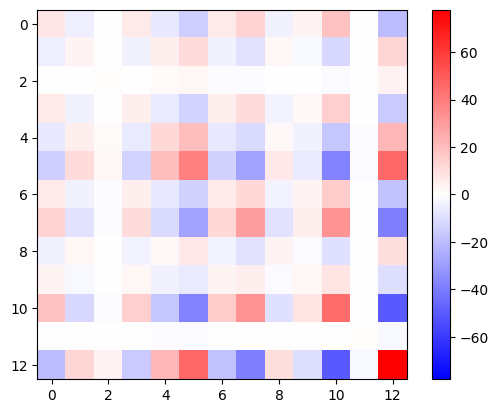

In [218]:
y = metrics_dash.e_std.isel(zi=0).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

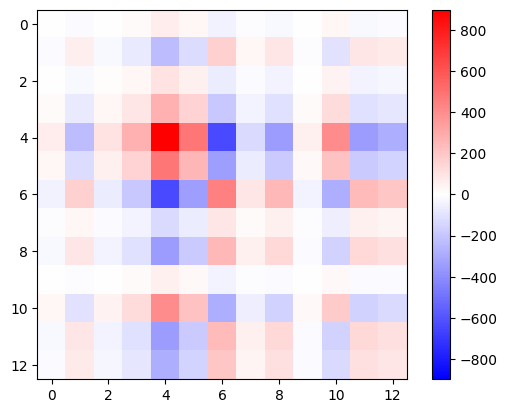

In [221]:
y = metrics_dash.APE_mean.isel(zi=1).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

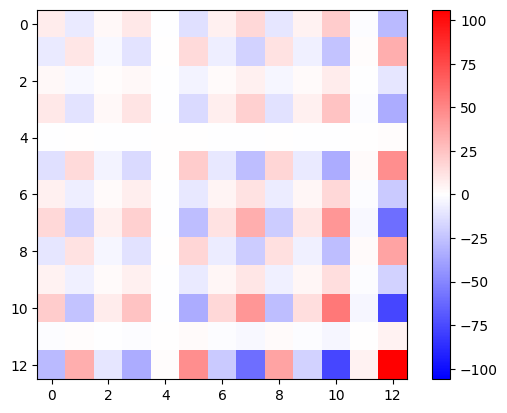

In [222]:
y = metrics_dash.APE_std.isel(zi=1).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

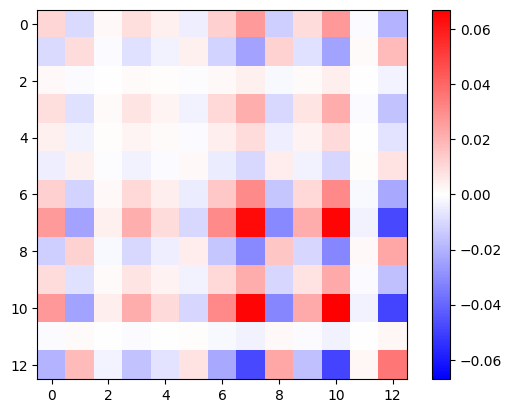

In [223]:
y = metrics_dash.APE_std.isel(zi=0).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

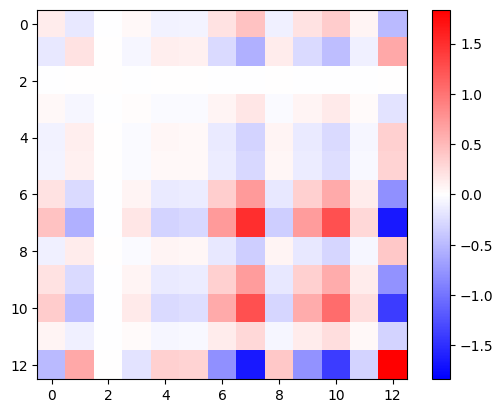

In [225]:
y = metrics_dash.KE_std.isel(zl=1).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

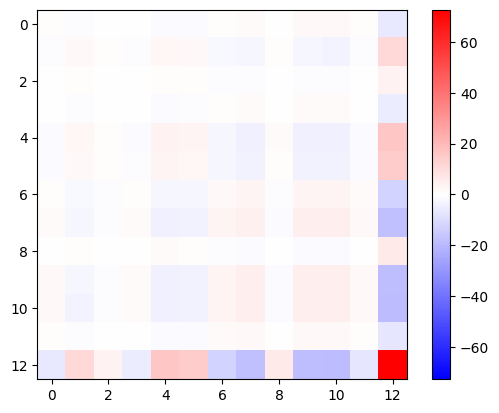

In [226]:
y = metrics_dash.KE_std.isel(zl=0).values.reshape(Nens,-1)
C_yx = y.T @ x / Nens
J = C_yx @ np.linalg.inv(C_xx)
S = J.T @ J
vmax = np.abs(S).max()
plt.imshow(S, vmin=-vmax, vmax=vmax, cmap='bwr')
plt.colorbar()

In [242]:
metrics = xr.open_mfdataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series/metrics*.nc')


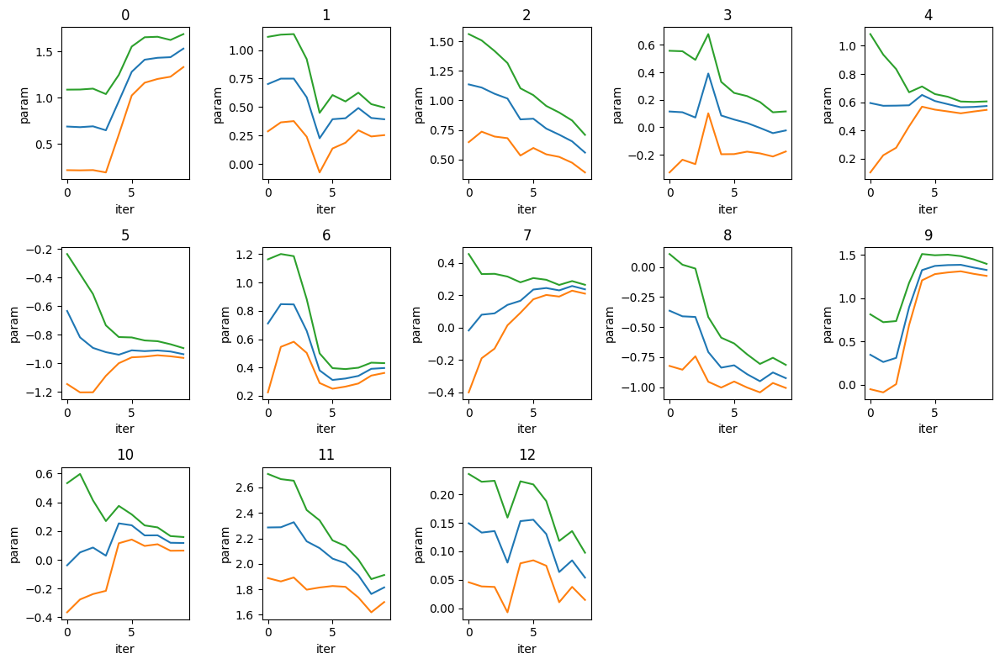

In [243]:
plt.figure(figsize=(12,8))
for pdim in range(13):
    plt.subplot(3,5,pdim+1)
    metrics.param.mean('ens').isel(pdim=pdim).plot()
    metrics.param.min('ens').isel(pdim=pdim).plot()
    metrics.param.max('ens').isel(pdim=pdim).plot()
    plt.title(pdim)

plt.tight_layout()

In [244]:
metrics = xr.open_mfdataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_200/metrics*.nc')


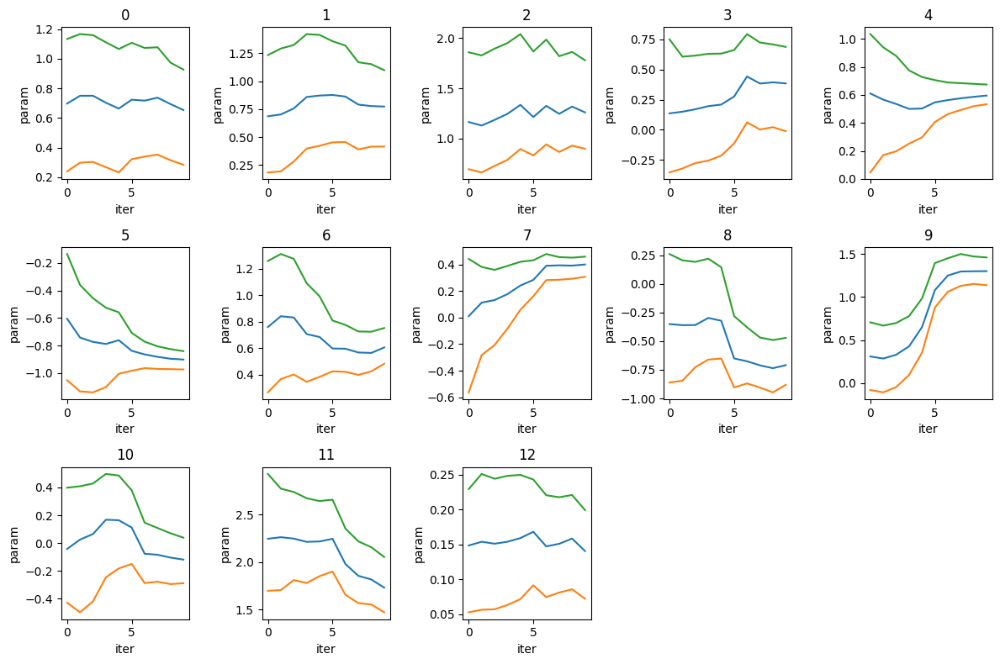

In [245]:
plt.figure(figsize=(12,8))
for pdim in range(13):
    plt.subplot(3,5,pdim+1)
    metrics.param.mean('ens').isel(pdim=pdim).plot()
    metrics.param.min('ens').isel(pdim=pdim).plot()
    metrics.param.max('ens').isel(pdim=pdim).plot()
    plt.title(pdim)

plt.tight_layout()

In [237]:
metrics = xr.open_mfdataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/20-years/R2_FGR3_series_PJ_all_full_eANN/metrics*.nc')


In [238]:
metrics = metrics.isel(pdim=slice(-13,None))

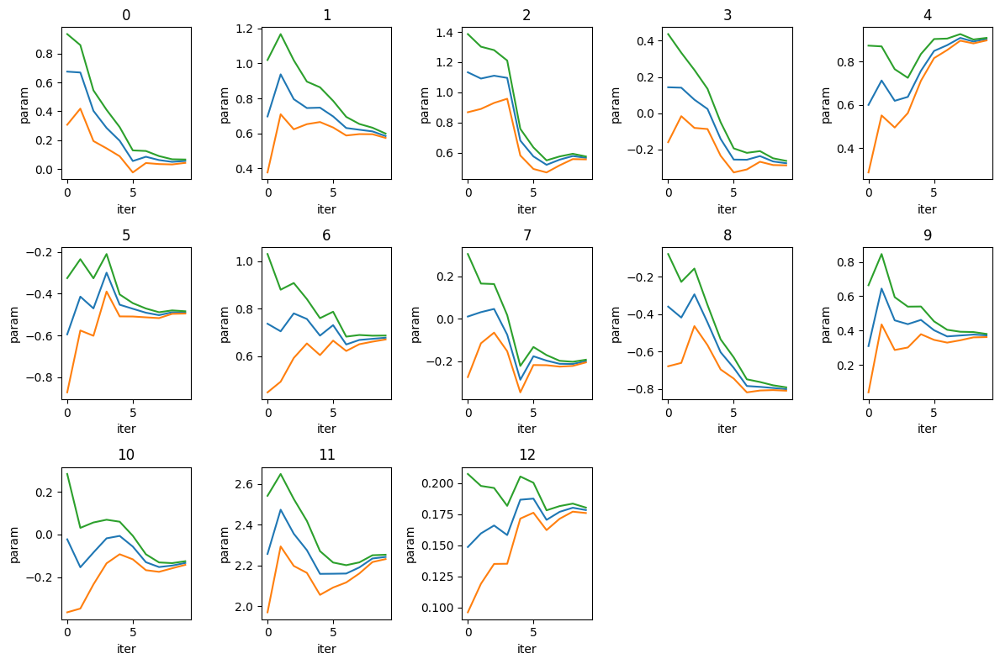

In [240]:
plt.figure(figsize=(12,8))
for pdim in range(13):
    plt.subplot(3,5,pdim+1)
    metrics.param.mean('ens').isel(pdim=pdim).plot()
    metrics.param.min('ens').isel(pdim=pdim).plot()
    metrics.param.max('ens').isel(pdim=pdim).plot()
    plt.title(pdim)

plt.tight_layout()